This notebook performs a PCA for a subset of records, filtered by archiveType/paleoData_proxy. For each subset, the following algorithm is being used:

1. Filter archive_type and paleoData_proxy (defines subset) and produces summary plots of the data, in particular regarding: coverage, resolution and length of the records. This gives us information for the next step, in which we need to choose the parameters for the PCA
2. Define proxy specific parameters for the PCA:
    - period (start and end year): choose a period of sufficient data density (all records chosen for the analysis need to at least overlap during this period)
    - minimum resolution: records exceeding this resolution are being excluded from the analysis. Records with higher resolution will be subsampled to create homogeneous resolution across all the records.
    - record length: records shorter than the record length are being excluded from the analysis.
    - The choice of parameters will determine the success of the PCA. There is a trade-off between the number of records included and the quality (i.e. period/record length/resolution).
    - Summary figures are being produced for the filtered data
    - z-scores added to dataframe (mean=0 and std=1 over the entire record) as 'paleoData_zscores'
    - note: z-scores may be biased if records are only partly overlapping in time, or increase in availability over time, or both.
4. Homogenise data dimensions across the records
    - defines a homogenised time variable over the target period and with the target resolution (as defined in the last step), which is saved as a new column in the dataframe named 'years_hom'
    - creates a data matrix with dimensions n_records x n_time which is saved as a new column in df, named 'paleoData_values_hom' and 'paleoData_zscores_hom'.
    - Note that this data is formatted as a np.ma.masked_array, where missing data is set to zero and masked out.
6. PCA
    - obtains covariance matrix of paleoData_zscores_hom (note that for every two records the covariance is calculated over their intersect of data availability)
    - obtains eigenvectors and eigenvalues via SVD composition
    - obtains and plots fraction of explained variance, first two PCs and load for first two EOFs vs ordering in the data frame.


2025/01/08 v0: Outlined by Michael N. Evans for MT analysis; MT analysis notebook written by Lucie J. Luecke.

2025/02/07-03/19 v0.9: Notebook now includes summary figures at the end which plot results for different proxies on same axis and the global map of EOF loadings. Added documentation.  Minor changes to make table3 of the manuscript for ESSD, and to revise MT_PCA.pdf output.

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature 
from matplotlib.gridspec import GridSpec as GS
import scipy.io as sio
from copy import deepcopy as dc

In [3]:
# choose working directory
wdir = '/home/jupyter-lluecke/compile_proxy_database_v2.1'
os.chdir(wdir)
print(wdir)
import functions as f # contains functions for data processing, plotting etc.
import f_analysis as fan

# contains functions for data analysis

/home/jupyter-lluecke/compile_proxy_database_v2.1


In [4]:
# read dataframe 
# e.g. PAGES2k but works with any dataframe as long as notation is followed

db_name = 'dod2k_dupfree_dupfree_MT'

# load dataframe
df = f.load_compact_dataframe_from_csv(db_name)

print(df.originalDatabase.unique())

df.name = db_name

archive_colour, archives_sorted, proxy_marker  = fan.df_colours_markers()

['FE23 (Breitenmoser et al. (2014))' 'CoralHydro2k v1.0.0'
 'dod2k_composite_standardised' 'Iso2k v1.0.1' 'SISAL v3']
0 tree 3150
1 speleothem 562
2 coral 297
3 glacier ice 170
4 marine sediment 151
5 lake sediment 151
6 documents 15
7 sclerosponge 7
8 ground ice 4
9 borehole 3
10 mollusk shells 2
11 terrestrial sediment 2
12 hybrid 1
13 bivalve 1


In [5]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1597 entries, 0 to 1596
Data columns (total 19 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   archiveType                           1597 non-null   object 
 1   climateInterpretation_variable        1597 non-null   object 
 2   climateInterpretation_variableDetail  1597 non-null   object 
 3   dataSetName                           1597 non-null   object 
 4   datasetId                             1597 non-null   object 
 5   duplicateDetails                      1597 non-null   object 
 6   geo_meanElev                          1565 non-null   float32
 7   geo_meanLat                           1597 non-null   float32
 8   geo_meanLon                           1597 non-null   float32
 9   geo_siteName                          1597 non-null   object 
 10  originalDataURL                       1597 non-null   object 
 11  originalDatabase 

# data analysis

In [6]:
time    = {}
data    = {}
PCs     = {}
EOFs    = {}
foev    = {}
pca_rec = {}

keys    = []

## tree TRW

### filter archive_type and paleoData_proxy

n_records   :  1059
archive type:  {'tree'}
proxy type:    {'TRW'}


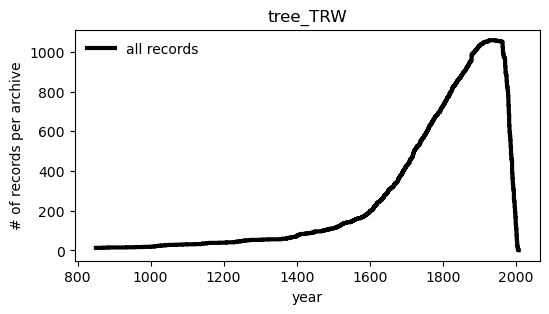

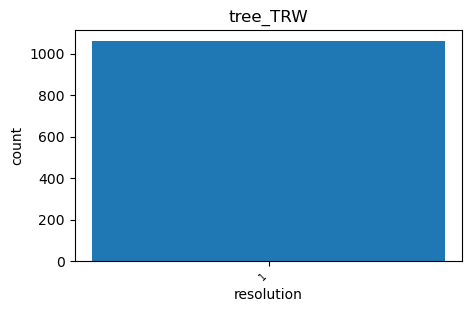

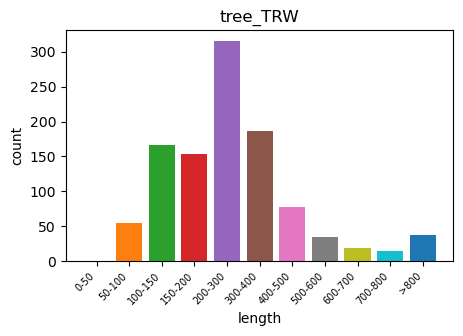

0 tree 3150
1 speleothem 562
2 coral 297
3 glacier ice 170
4 marine sediment 151
5 lake sediment 151
6 documents 15
7 sclerosponge 7
8 ground ice 4
9 borehole 3
10 mollusk shells 2
11 terrestrial sediment 2
12 hybrid 1
13 bivalve 1


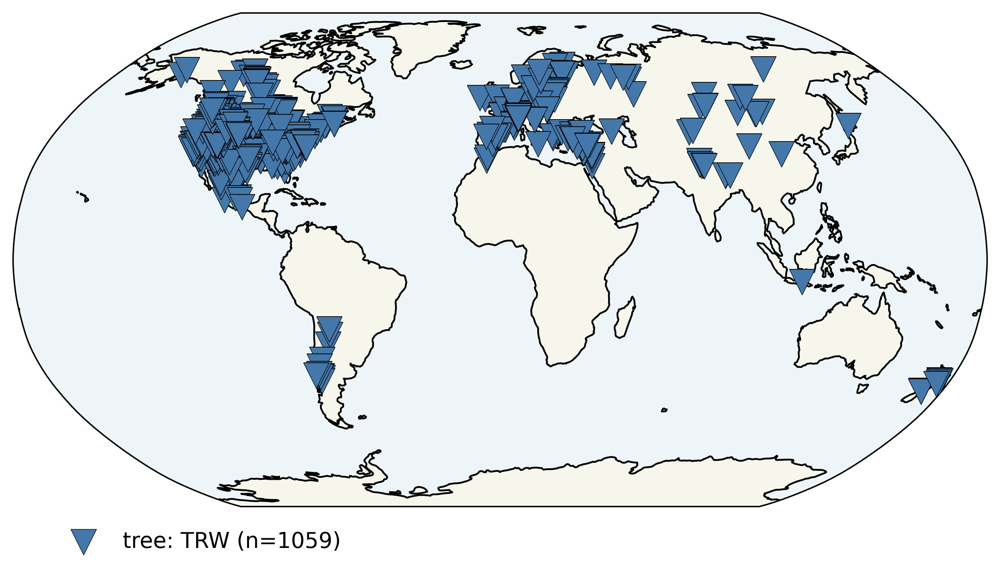

In [7]:
# (1) filter for archiveType and/or paleoData_proxy: 

at = 'tree'
pt = 'TRW'
key = '%s_%s'%(at, pt)

keys += [key]

df_proxy = df.loc[(df['archiveType']==at)].loc[(df['paleoData_proxy']==pt)] # filter records for specific archive and proxy type

n_recs = len(df_proxy) # number of records
print('n_records   : ', n_recs)

print('archive type: ', set(df_proxy['archiveType']))
print('proxy type:   ', set(df_proxy['paleoData_proxy']))

# (2) plot the coverage coverage per archive 

fan.covert_subannual_to_annual(df_proxy)

df_proxy = fan.add_aux_variables(df_proxy, key)

# (3) plot the spatial distribution of records
geo_fig = fan.geo_plot(df_proxy)

### filter for target period, resolution and minimum record length

Keep 71 records with nyears>=600 during 1000-2000. Exclude 988 records.
Keep 71 records with resolution <=1. Exclude 0 records.


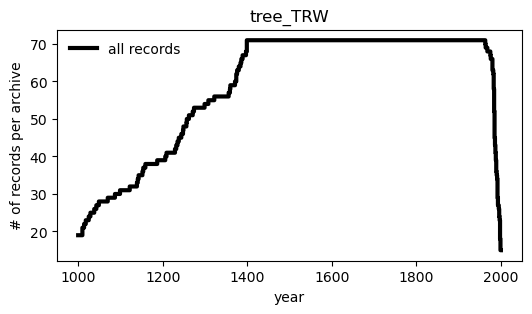

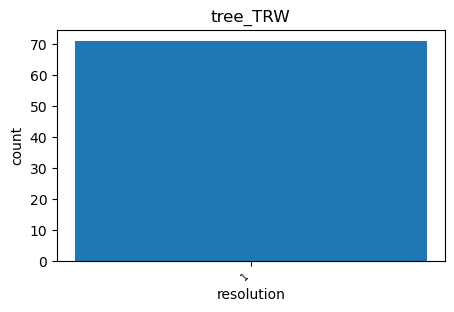

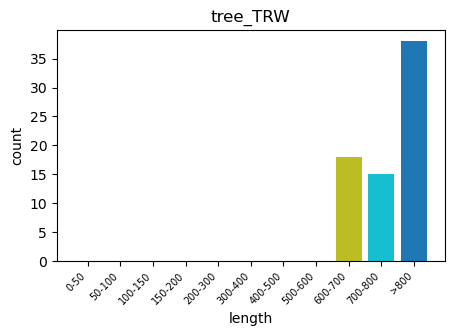

        miny    maxy                   originalDatabase
0     1360.0  1983.0  FE23 (Breitenmoser et al. (2014))
3      935.0  1993.0  FE23 (Breitenmoser et al. (2014))
146   1153.0  1986.0  FE23 (Breitenmoser et al. (2014))
198   1123.0  2001.0  FE23 (Breitenmoser et al. (2014))
203   1381.0  2000.0  FE23 (Breitenmoser et al. (2014))
...      ...     ...                                ...
982   1390.0  1998.0  FE23 (Breitenmoser et al. (2014))
998    980.0  1985.0  FE23 (Breitenmoser et al. (2014))
1001  1236.0  1984.0  FE23 (Breitenmoser et al. (2014))
1038  1377.0  1999.0  FE23 (Breitenmoser et al. (2014))
1053  1357.0  1975.0  FE23 (Breitenmoser et al. (2014))

[71 rows x 3 columns]


In [8]:
#========================= PROXY SPECIFIC=========================
minres    = 1                         # homogenised resolution
mny       = 1000                      # start year of homogenised time coord
mxy       = 2000                      # end year of homogenised time coord
nyears    = np.min([600, mxy-mny])    # minimum length of each record
#====================================================================

# filter for record length during target period
df_proxy = fan.filter_record_length(df_proxy, nyears, mny, mxy, key)

# filter for resolution
df_proxy = fan.filter_resolution(df_proxy, minres, key)

# plot coverage and resolution
fan.plot_coverage(df_proxy, np.arange(mny, mxy+minres, minres), key)
fan.plot_resolution(df_proxy, key)
fan.plot_length(df_proxy, key)

n_recs = len(df_proxy) # final number of records


print(df_proxy[['miny', 'maxy', 'originalDatabase']])

pca_rec[key] = df_proxy['datasetId']

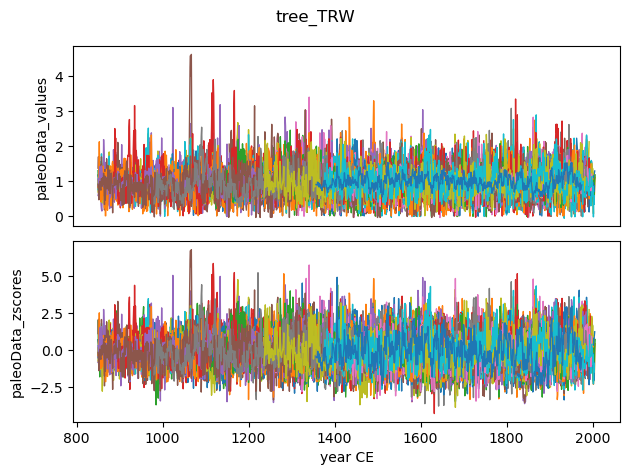

In [9]:
# add 'z-scores' to dataframe and plot z-scores and values
df_proxy = fan.add_zscores_to_df(df_proxy, key, plot_output=True)


### homogenise data dimensions across the records

In [10]:
# define new homogenised time coordinate
df_proxy, years_hom = fan.homogenise_time(df_proxy, mny, mxy, minres, key)
time[key] = years_hom

Homogenised time coordinate: 1000-2000 CE
Resolution: [1] years
INTERSECT: 1400-1963


(71, 1001)
Real intersect after homogenising resolution: 
INTERSECT: 1400-1963


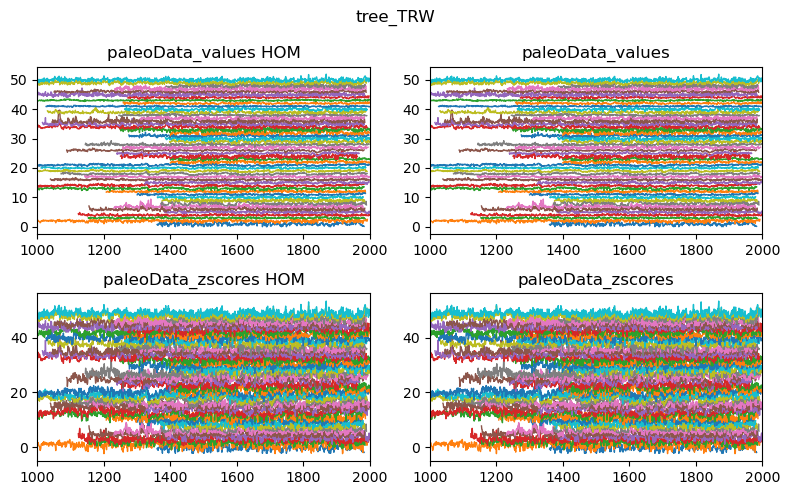

In [11]:
# assign the paleoData_values to the non-missing values in the homogenised data array

out = fan.homogenise_data_dimensions(df_proxy, years_hom, key, plot_output=True) # returns list of homogenised paleoData_values and paleoData_zscores
paleoData_values_hom, paleoData_zscores_hom, year_hom_avbl, zsco_hom_avbl = out

# define new columns in df_filt
new_columns = {'year_hom': [years_hom]*n_recs, 
               'year_hom_avbl': year_hom_avbl, 
               'paleoData_values_hom': [paleoData_values_hom[ii, :] for ii in range(n_recs)], 
               'paleoData_zscores_hom': [paleoData_zscores_hom[ii, :] for ii in range(n_recs)], 
               'paleoData_zscores_hom_avbl': zsco_hom_avbl}
df_proxy = df_proxy.assign(**new_columns)

print('Real intersect after homogenising resolution: ')
intrsct = fan.find_shared_period(df_proxy, minmax=(mny, mxy), time='year_hom_avbl', 
                             data='paleoData_zscores_hom_avbl')
data[key] = paleoData_zscores_hom


### PCA

In [12]:
covariance, overlap = fan.calc_covariance_matrix(df_proxy)

short records :  []


saved figure in /figs/dod2k_dupfree_dupfree_MT/foev_tree_TRW.pdf


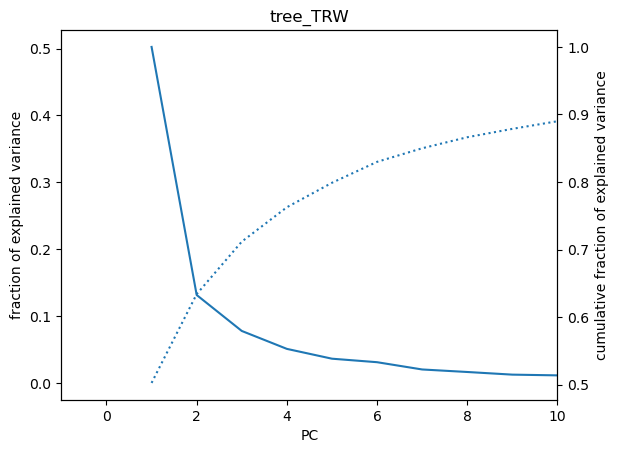

In [13]:
eigenvalues, eigenvectors = fan.PCA(covariance)

foev[key] = fan.fraction_of_explained_var(covariance, eigenvalues, n_recs, key, df.name)

saved figure in /figs/dod2k_dupfree_dupfree_MT/PCs_tree_TRW.pdf
saved figure in /figs/dod2k_dupfree_dupfree_MT/EOFloading_tree_TRW.pdf


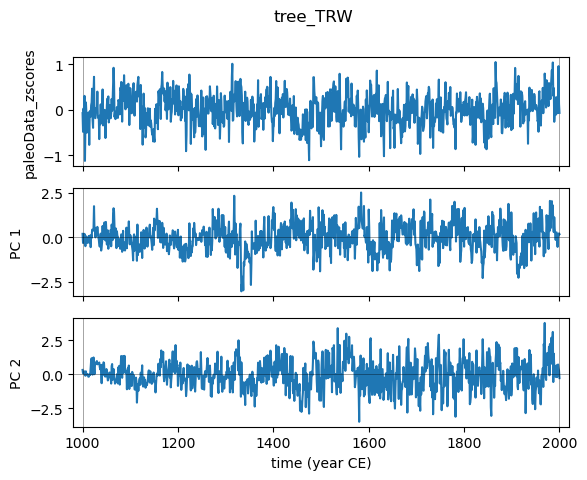

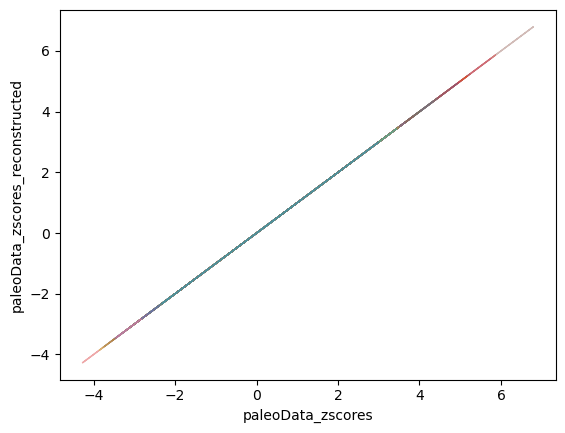

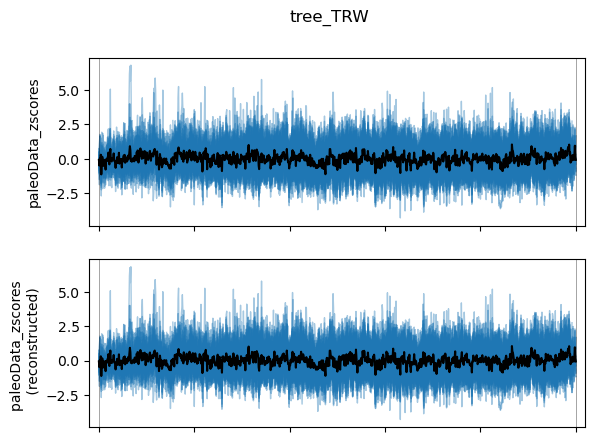

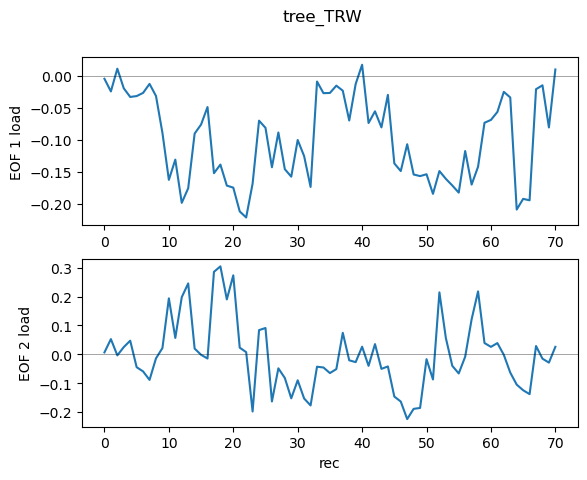

In [14]:
PCs[key], EOFs[key] = fan.plot_PCs(years_hom, eigenvectors, paleoData_zscores_hom, key, df.name)

In [15]:
print('Finished for %s'%key)

Finished for tree_TRW


## tree d18O

### filter archive_type and paleoData_proxy

n_records   :  59
archive type:  {'tree'}
proxy type:    {'d18O'}


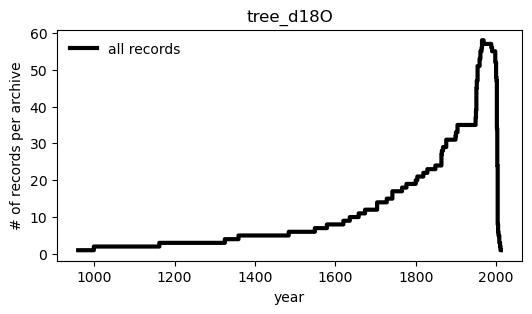

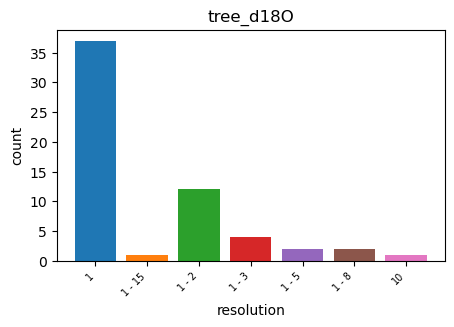

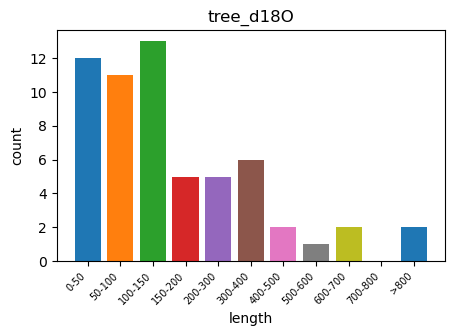

0 tree 3150
1 speleothem 562
2 coral 297
3 glacier ice 170
4 marine sediment 151
5 lake sediment 151
6 documents 15
7 sclerosponge 7
8 ground ice 4
9 borehole 3
10 mollusk shells 2
11 terrestrial sediment 2
12 hybrid 1
13 bivalve 1


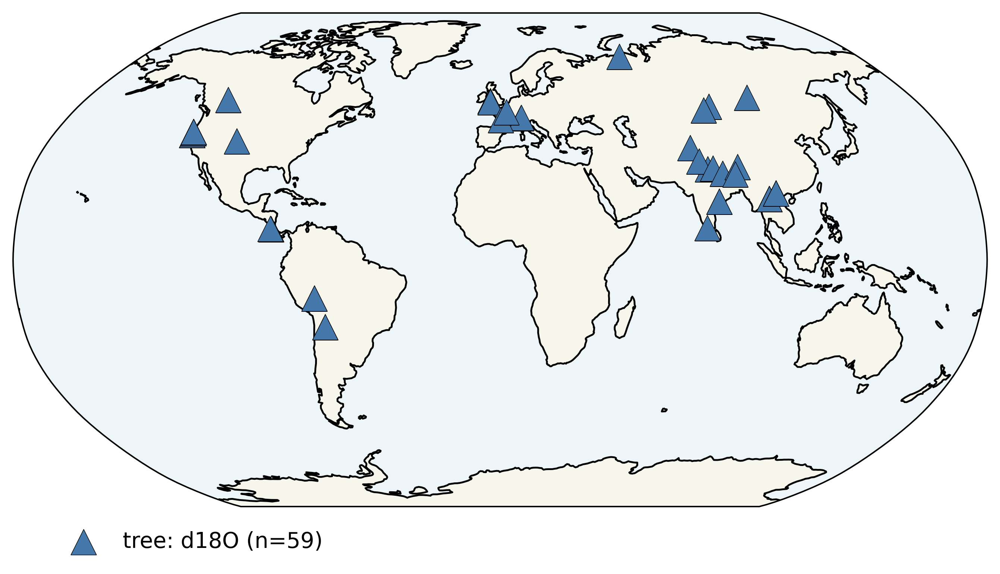

In [16]:
# (1) filter for archiveType and/or paleoData_proxy: 

at = 'tree'
pt = 'd18O'
key = '%s_%s'%(at, pt)

keys += [key]

df_proxy = df.loc[(df['archiveType']==at)].loc[(df['paleoData_proxy']==pt)] # filter records for specific archive and proxy type

n_recs = len(df_proxy) # number of records
print('n_records   : ', n_recs)

print('archive type: ', set(df_proxy['archiveType']))
print('proxy type:   ', set(df_proxy['paleoData_proxy']))

# (2) plot the coverage per archive 

fan.covert_subannual_to_annual(df_proxy)

df_proxy = fan.add_aux_variables(df_proxy, key)


# (3) plot the spatial distribution of records
geo_fig = fan.geo_plot(df_proxy)


### filter for target period, resolution and minimum record length

Keep 32 records with nyears>=100 during 1700-2000. Exclude 27 records.
Keep 23 records with resolution <=2. Exclude 9 records.


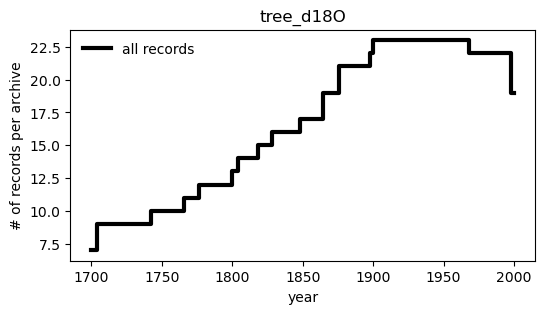

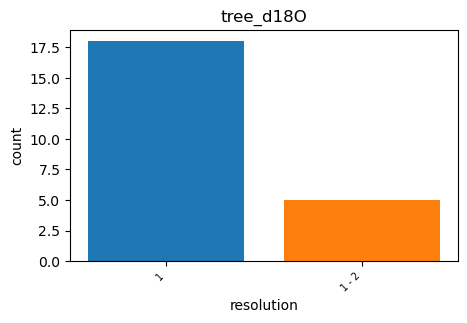

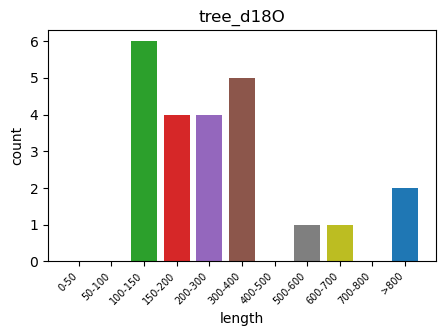

        miny    maxy originalDatabase
1346  1000.0  1998.0     Iso2k v1.0.1
1348  1675.0  2003.0     Iso2k v1.0.1
1349  1865.0  1969.0     Iso2k v1.0.1
1351  1659.0  2001.0     Iso2k v1.0.1
1352  1900.0  2002.0     Iso2k v1.0.1
1353  1820.0  2004.0     Iso2k v1.0.1
1354  1865.0  2004.0     Iso2k v1.0.1
1355  1877.0  1998.0     Iso2k v1.0.1
1356  1877.0  1998.0     Iso2k v1.0.1
1367  1805.0  2004.0     Iso2k v1.0.1
1368  1705.0  2004.0     Iso2k v1.0.1
1371  1705.0  2004.0     Iso2k v1.0.1
1372  1901.0  2004.0     Iso2k v1.0.1
1373  1830.0  2010.0     Iso2k v1.0.1
1374  1850.0  2012.0     Iso2k v1.0.1
1375  1360.0  2004.0     Iso2k v1.0.1
1377  1621.0  2008.0     Iso2k v1.0.1
1382  1767.0  2008.0     Iso2k v1.0.1
1383  1778.0  2000.0     Iso2k v1.0.1
1385  1801.0  2000.0     Iso2k v1.0.1
1391  1163.0  2005.0     Iso2k v1.0.1
1400  1485.0  2005.0     Iso2k v1.0.1
1401  1743.0  2011.0     Iso2k v1.0.1


In [17]:
#========================= PROXY SPECIFIC=========================
minres    = 2                         # homogenised resolution
mny       = 1700                      # start year of homogenised time coord
mxy       = 2000                      # end year of homogenised time coord
nyears    = np.min([100, mxy-mny])    # minimum length of each record
#====================================================================

# filter for record length during target period
df_proxy = fan.filter_record_length(df_proxy, nyears, mny, mxy, key)

# filter for resolution
df_proxy = fan.filter_resolution(df_proxy, minres, key)

# plot coverage and resolution
fan.plot_coverage(df_proxy, np.arange(mny, mxy+minres, minres), key)
fan.plot_resolution(df_proxy, key)
fan.plot_length(df_proxy, key)

n_recs = len(df_proxy) # final number of records


print(df_proxy[['miny', 'maxy', 'originalDatabase']])

pca_rec[key] = df_proxy['datasetId']

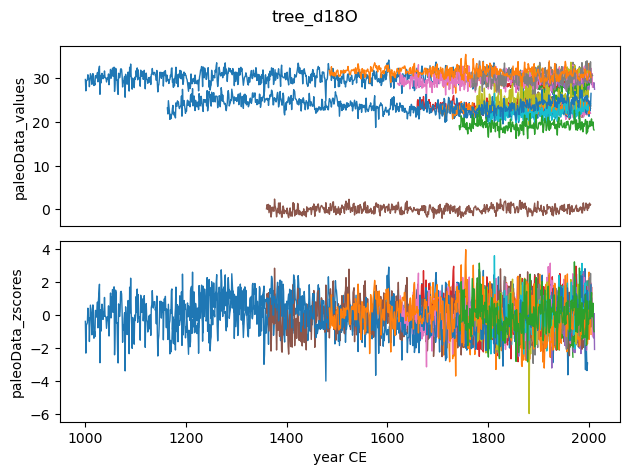

In [18]:
# add 'z-scores' to dataframe and plot z-scores and values
df_proxy = fan.add_zscores_to_df(df_proxy, key, plot_output=True)


### homogenise data dimensions across the records

In [19]:
# define new homogenised time coordinate
df_proxy, years_hom = fan.homogenise_time(df_proxy, mny, mxy, minres, key)
time[key] = years_hom


Homogenised time coordinate: 1700-2000 CE
Resolution: [2] years
INTERSECT: 1901-1969


(23, 151)
Real intersect after homogenising resolution: 
INTERSECT: 1902-1970


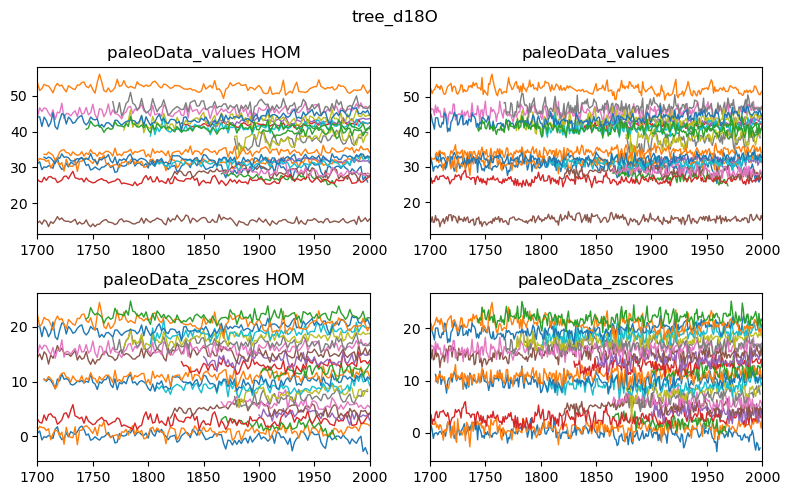

In [20]:
# assign the paleoData_values to the non-missing values in the homogenised data array

out = fan.homogenise_data_dimensions(df_proxy, years_hom, key, plot_output=True) # returns list of homogenised paleoData_values and paleoData_zscores
paleoData_values_hom, paleoData_zscores_hom, year_hom_avbl, zsco_hom_avbl = out

# define new columns in df_filt
new_columns = {'year_hom': [years_hom]*n_recs, 
               'year_hom_avbl': year_hom_avbl, 
               'paleoData_values_hom': [paleoData_values_hom[ii, :] for ii in range(n_recs)], 
               'paleoData_zscores_hom': [paleoData_zscores_hom[ii, :] for ii in range(n_recs)], 
               'paleoData_zscores_hom_avbl': zsco_hom_avbl}
df_proxy = df_proxy.assign(**new_columns)

print('Real intersect after homogenising resolution: ')
intrsct = fan.find_shared_period(df_proxy, minmax=(mny, mxy), time='year_hom_avbl', 
                             data='paleoData_zscores_hom_avbl')

data[key] = paleoData_zscores_hom


In [21]:
paleoData_values_hom.shape

(23, 151)

### PCA

In [22]:
covariance, overlap = fan.calc_covariance_matrix(df_proxy)

short records :  [36. 35. 36. 35.]


In [23]:
covariance.shape

(23, 23)

saved figure in /figs/dod2k_dupfree_dupfree_MT/foev_tree_d18O.pdf


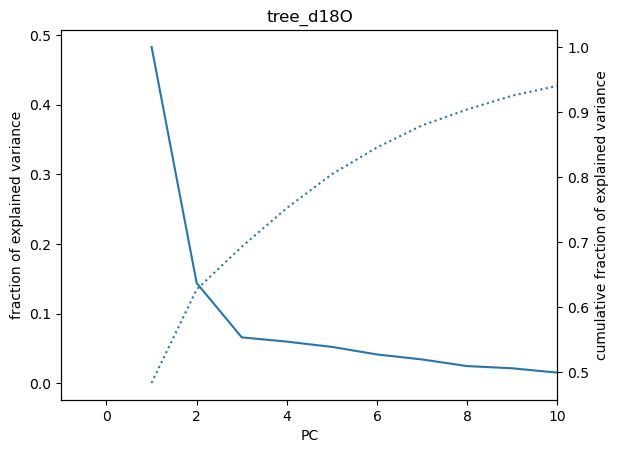

In [24]:
eigenvalues, eigenvectors = fan.PCA(covariance)

foev[key] = fan.fraction_of_explained_var(covariance, eigenvalues, n_recs, key, df.name)


In [25]:
eigenvectors.shape

(23, 23)

saved figure in /figs/dod2k_dupfree_dupfree_MT/PCs_tree_d18O.pdf
saved figure in /figs/dod2k_dupfree_dupfree_MT/EOFloading_tree_d18O.pdf


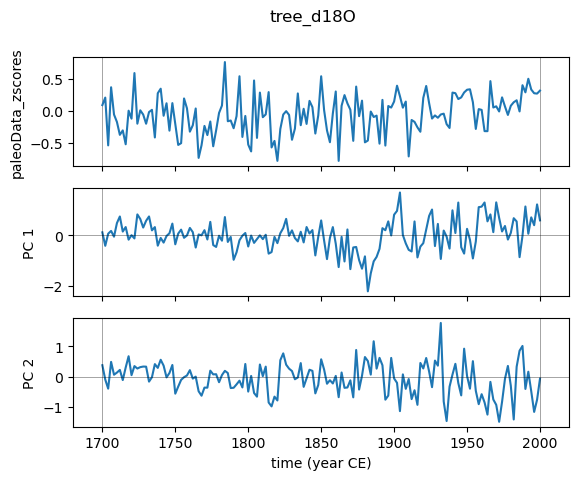

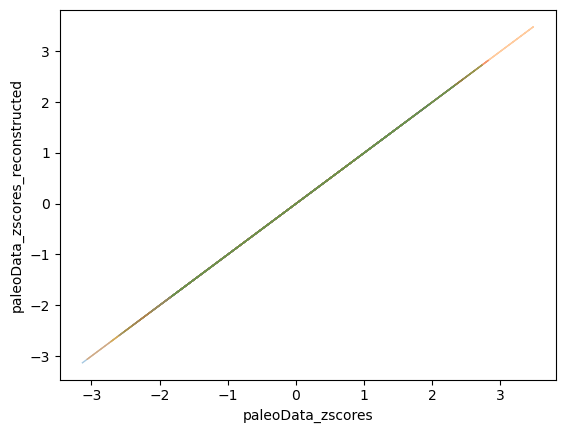

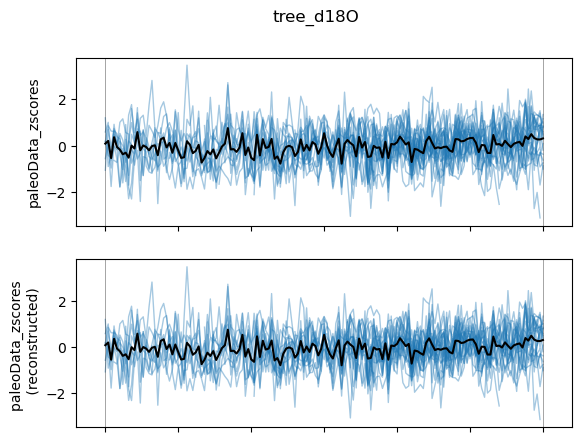

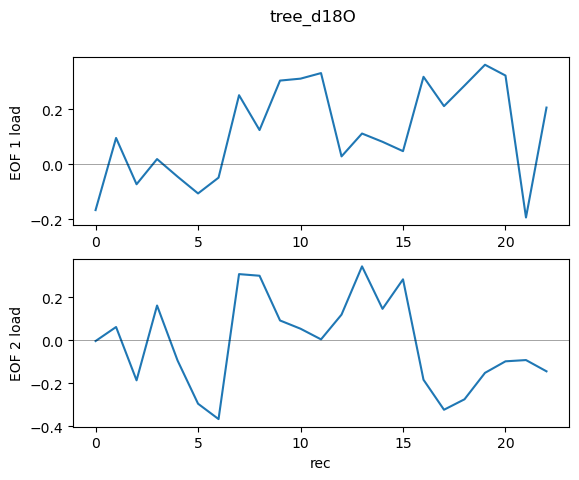

In [26]:
PCs[key], EOFs[key] = fan.plot_PCs(years_hom, eigenvectors, paleoData_zscores_hom, key, df.name)

In [27]:
PCs[key].shape

(23, 151)

In [28]:
print('Finished for %s'%key)
# raise Exception

Finished for tree_d18O


## coral d18O

### filter archive_type and paleoData_proxy

n_records   :  109
archive type:  {'coral'}
proxy type:    {'d18O'}


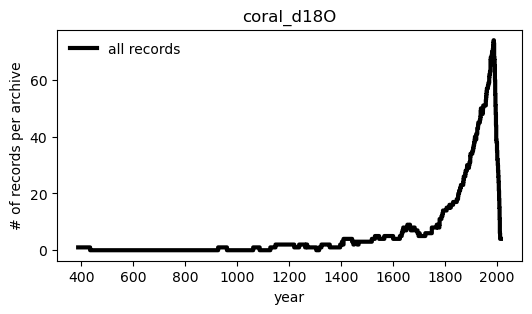

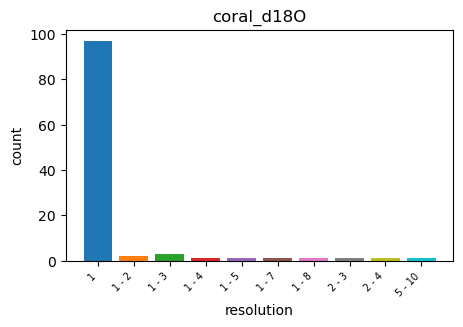

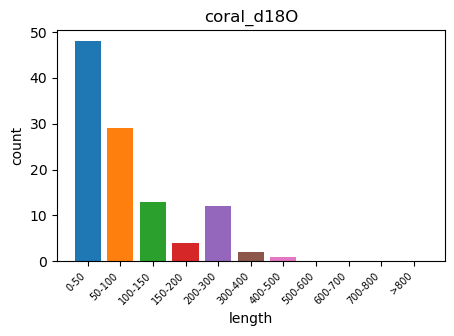

0 tree 3150
1 speleothem 562
2 coral 297
3 glacier ice 170
4 marine sediment 151
5 lake sediment 151
6 documents 15
7 sclerosponge 7
8 ground ice 4
9 borehole 3
10 mollusk shells 2
11 terrestrial sediment 2
12 hybrid 1
13 bivalve 1


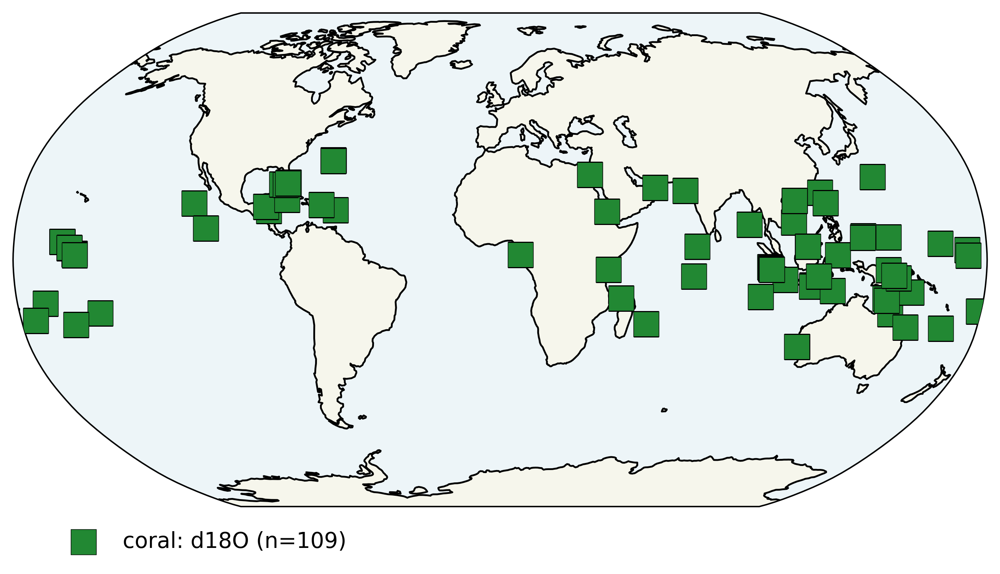

In [29]:
# (1) filter for archiveType and/or paleoData_proxy: 

at = 'coral'
pt = 'd18O'
key = '%s_%s'%(at, pt)

keys += [key]

df_proxy = df.loc[(df['archiveType']==at)].loc[(df['paleoData_proxy']==pt)] # filter records for specific archive and proxy type

n_recs = len(df_proxy) # number of records
print('n_records   : ', n_recs)

print('archive type: ', set(df_proxy['archiveType']))
print('proxy type:   ', set(df_proxy['paleoData_proxy']))

# (2) plot the coverage per archive 

fan.covert_subannual_to_annual(df_proxy)

df_proxy = fan.add_aux_variables(df_proxy, key)


# (3) plot the spatial distribution of records
geo_fig = fan.geo_plot(df_proxy)

### filter for target period, resolution and minimum record length

Keep 31 records with nyears>=90 during 1750-2000. Exclude 78 records.
Keep 28 records with resolution <=1. Exclude 3 records.


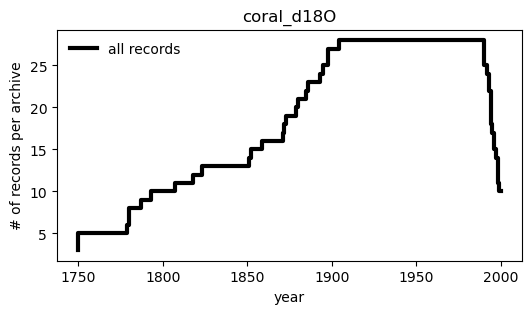

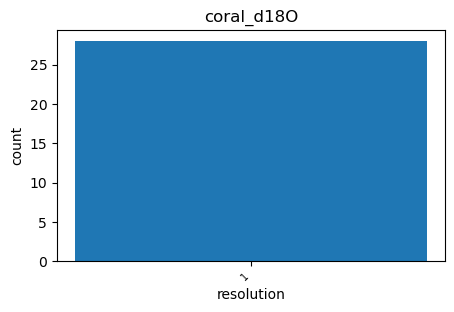

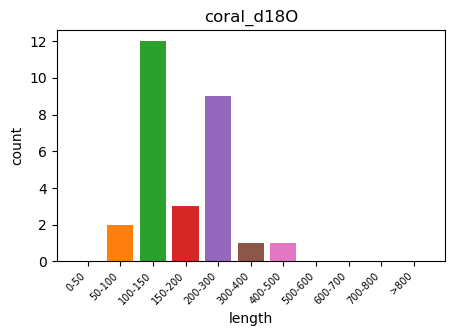

        miny    maxy     originalDatabase
1068  1852.0  1990.0  CoralHydro2k v1.0.0
1072  1860.0  1990.0  CoralHydro2k v1.0.0
1086  1872.0  1994.0  CoralHydro2k v1.0.0
1087  1873.0  1994.0  CoralHydro2k v1.0.0
1088  1751.0  1995.0  CoralHydro2k v1.0.0
1089  1751.0  1994.0  CoralHydro2k v1.0.0
1090  1781.0  1999.0  CoralHydro2k v1.0.0
1091  1781.0  1998.0  CoralHydro2k v1.0.0
1093  1896.0  1998.0  CoralHydro2k v1.0.0
1096  1808.0  2009.0  CoralHydro2k v1.0.0
1102  1794.0  1994.0  CoralHydro2k v1.0.0
1103  1726.0  1996.0  CoralHydro2k v1.0.0
1104  1780.0  1997.0  CoralHydro2k v1.0.0
1112  1905.0  2016.0  CoralHydro2k v1.0.0
1113  1824.0  2016.0  CoralHydro2k v1.0.0
1114  1886.0  2002.0  CoralHydro2k v1.0.0
1119  1899.0  2008.0  CoralHydro2k v1.0.0
1121  1880.0  2012.0  CoralHydro2k v1.0.0
1122  1788.0  2013.0  CoralHydro2k v1.0.0
1123  1887.0  2011.0  CoralHydro2k v1.0.0
1128  1819.0  1998.0  CoralHydro2k v1.0.0
1137  1899.0  1996.0  CoralHydro2k v1.0.0
1138  1520.0  2011.0  CoralHydro2k

In [30]:
#========================= PROXY SPECIFIC=========================
minres    = 1                         # homogenised resolution
mny       = 1750                      # start year of homogenised time coord
mxy       = 2000                      # end year of homogenised time coord
nyears    = np.min([90, mxy-mny])    # minimum length of each record
#====================================================================

# filter for record length during target period
df_proxy = fan.filter_record_length(df_proxy, nyears, mny, mxy, key)

# filter for resolution
df_proxy = fan.filter_resolution(df_proxy, minres, key)

# plot coverage and resolution
fan.plot_coverage(df_proxy, np.arange(mny, mxy+minres, minres), key)
fan.plot_resolution(df_proxy, key)
fan.plot_length(df_proxy, key)

n_recs = len(df_proxy) # final number of records


print(df_proxy[['miny', 'maxy', 'originalDatabase']])

pca_rec[key] = df_proxy['datasetId']

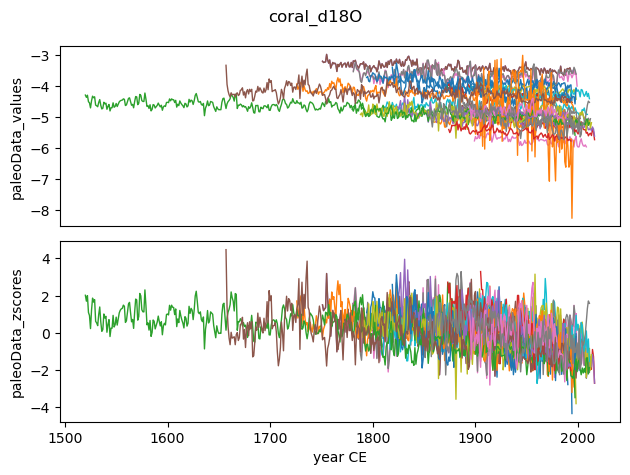

In [31]:
# add 'z-scores' to dataframe and plot z-scores and values
df_proxy = fan.add_zscores_to_df(df_proxy, key, plot_output=True)


### homogenise data dimensions across the records

In [32]:
# define new homogenised time coordinate
df_proxy, years_hom = fan.homogenise_time(df_proxy, mny, mxy, minres, key)
time[key] = years_hom


Homogenised time coordinate: 1750-2000 CE
Resolution: [1] years
INTERSECT: 1905-1990


(28, 251)
Real intersect after homogenising resolution: 
INTERSECT: 1905-1990


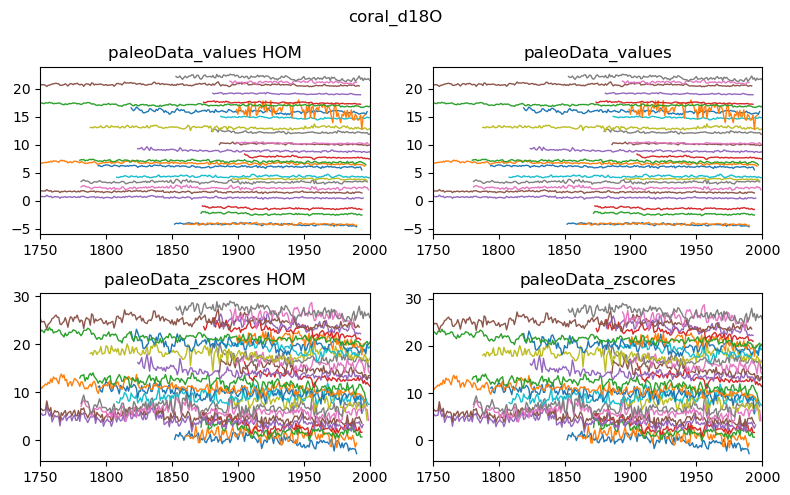

In [33]:
# assign the paleoData_values to the non-missing values in the homogenised data array

out = fan.homogenise_data_dimensions(df_proxy, years_hom, key, plot_output=True) # returns list of homogenised paleoData_values and paleoData_zscores
paleoData_values_hom, paleoData_zscores_hom, year_hom_avbl, zsco_hom_avbl = out

# define new columns in df_filt
new_columns = {'year_hom': [years_hom]*n_recs, 
               'year_hom_avbl': year_hom_avbl, 
               'paleoData_values_hom': [paleoData_values_hom[ii, :] for ii in range(n_recs)], 
               'paleoData_zscores_hom': [paleoData_zscores_hom[ii, :] for ii in range(n_recs)], 
               'paleoData_zscores_hom_avbl': zsco_hom_avbl}
df_proxy = df_proxy.assign(**new_columns)

print('Real intersect after homogenising resolution: ')
intrsct = fan.find_shared_period(df_proxy, minmax=(mny, mxy), time='year_hom_avbl', 
                             data='paleoData_zscores_hom_avbl')

data[key] = paleoData_zscores_hom


### PCA

In [34]:
covariance, overlap = fan.calc_covariance_matrix(df_proxy)

short records :  []


saved figure in /figs/dod2k_dupfree_dupfree_MT/foev_coral_d18O.pdf


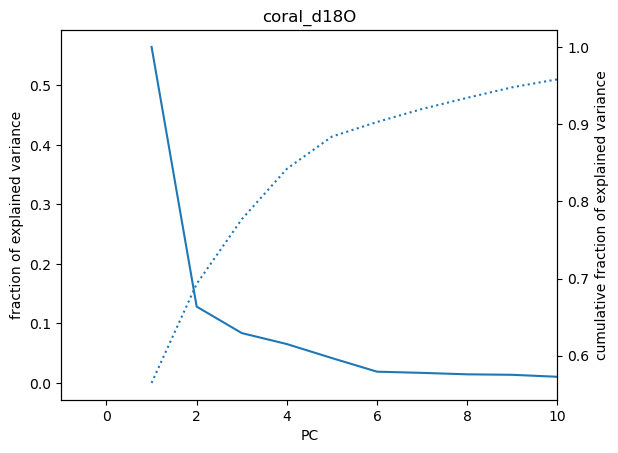

In [35]:
eigenvalues, eigenvectors = fan.PCA(covariance)

foev[key] = fan.fraction_of_explained_var(covariance, eigenvalues, n_recs, key, df.name)


In [36]:
paleoData_zscores_hom.shape

(28, 251)

saved figure in /figs/dod2k_dupfree_dupfree_MT/PCs_coral_d18O.pdf
saved figure in /figs/dod2k_dupfree_dupfree_MT/EOFloading_coral_d18O.pdf


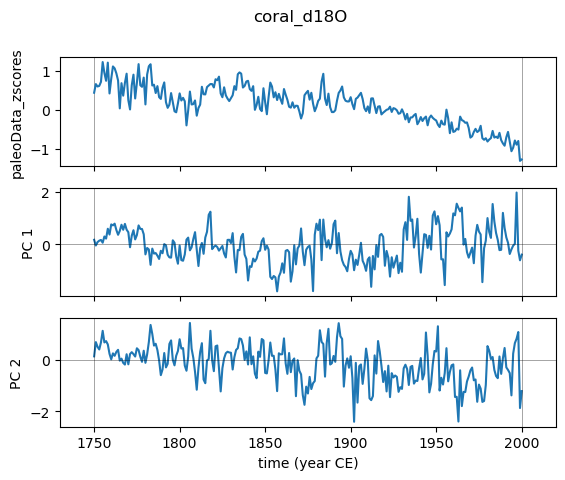

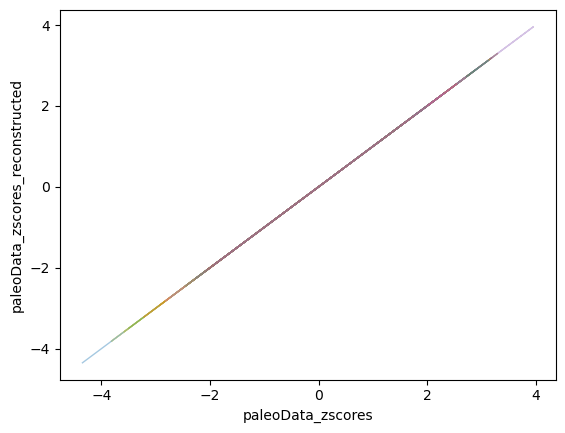

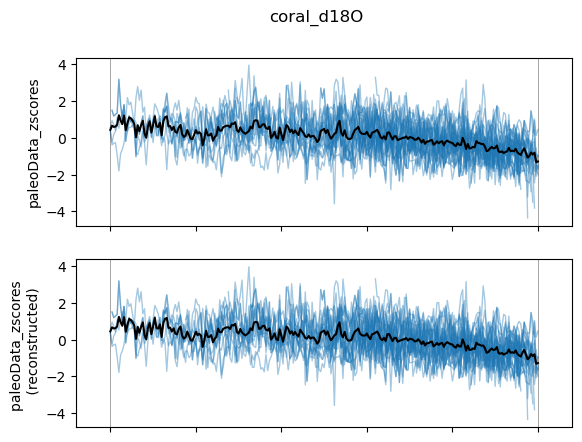

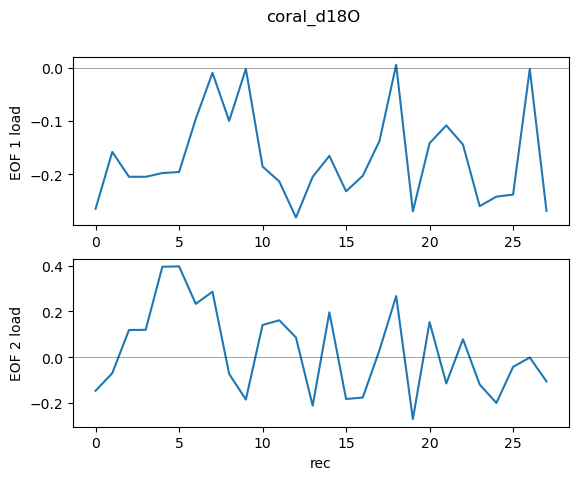

In [37]:
PCs[key], EOFs[key] = fan.plot_PCs(years_hom, eigenvectors, paleoData_zscores_hom, key, df.name)

In [38]:
print('Finished for %s'%key)

Finished for coral_d18O


## speleothem d18O

### filter archive_type and paleoData_proxy

n_records   :  217
archive type:  {'speleothem'}
proxy type:    {'d18O'}


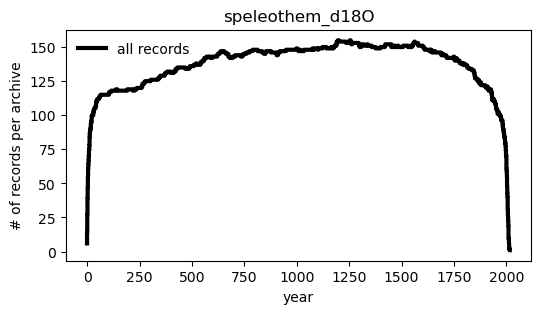

25 - 300  <350
1 - 150  <250
40 - 107  <150
1 - 88   <95
14 - 40   <45
14 - 69   <75
24 - 49   <55
10 - 34   <35
4 - 80   <85
6 - 7   <15
1 - 1239  <1250
8 - 59   <65
1 - 24   <25
23 - 895  <950
29 - 370  <450
2 - 4    <5
2 - 1078  <1150
3 - 1511  <1550
1 - 575  <650
7 - 528  <550


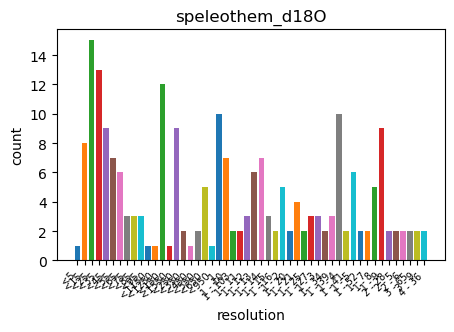

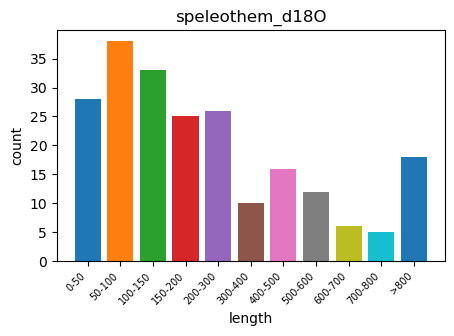

0 tree 3150
1 speleothem 562
2 coral 297
3 glacier ice 170
4 marine sediment 151
5 lake sediment 151
6 documents 15
7 sclerosponge 7
8 ground ice 4
9 borehole 3
10 mollusk shells 2
11 terrestrial sediment 2
12 hybrid 1
13 bivalve 1


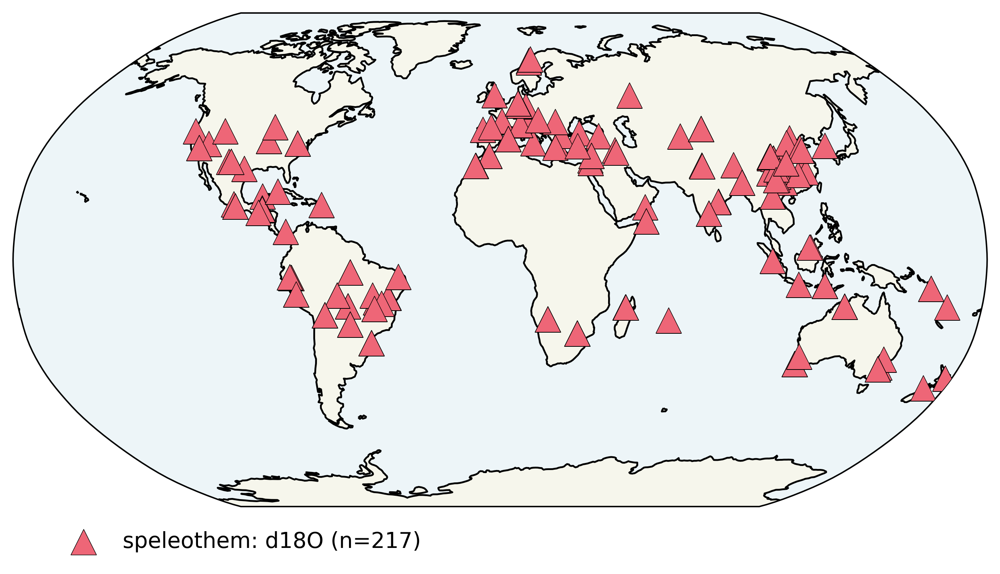

In [39]:
# (1) filter for archiveType and/or paleoData_proxy: 

at = 'speleothem'
pt = 'd18O'
key = '%s_%s'%(at, pt)

keys += [key]

df_proxy = df.loc[(df['archiveType']==at)].loc[(df['paleoData_proxy']==pt)] # filter records for specific archive and proxy type

n_recs = len(df_proxy) # number of records
print('n_records   : ', n_recs)

print('archive type: ', set(df_proxy['archiveType']))
print('proxy type:   ', set(df_proxy['paleoData_proxy']))

# (2) plot the coverage per archive 

fan.covert_subannual_to_annual(df_proxy)

df_proxy = fan.add_aux_variables(df_proxy, key, mincount=2)


# (3) plot the spatial distribution of records
geo_fig = fan.geo_plot(df_proxy)

### filter for target period, resolution and minimum record length

Keep 27 records with nyears>=500 during 650-1950. Exclude 190 records.
Keep 21 records with resolution <=11. Exclude 6 records.


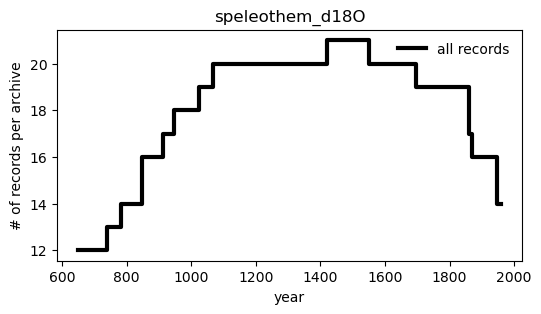

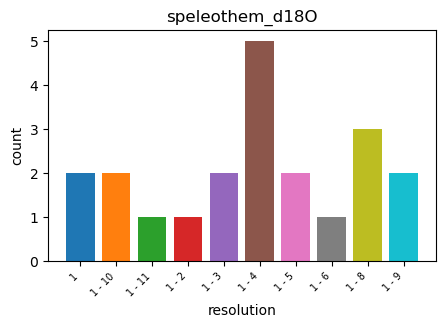

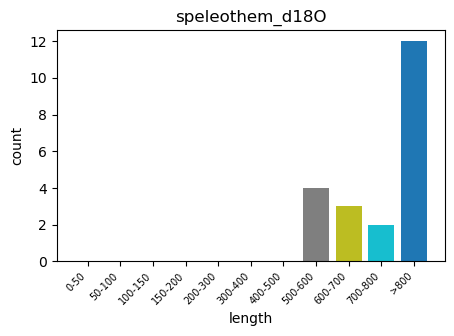

        miny    maxy originalDatabase
1323   624.0  1562.0     Iso2k v1.0.1
1324   487.0  2004.0     Iso2k v1.0.1
1329     1.0  2003.0     Iso2k v1.0.1
1330     1.0  2010.0     Iso2k v1.0.1
1337     1.0  1999.0     Iso2k v1.0.1
1338   854.0  2007.0     Iso2k v1.0.1
1421   790.0  1953.0         SISAL v3
1426   491.0  1860.0         SISAL v3
1444     0.0  2005.0         SISAL v3
1457     1.0  2010.0         SISAL v3
1458   949.0  1957.0         SISAL v3
1464  1076.0  2007.0         SISAL v3
1481     0.0  1986.0         SISAL v3
1482  1423.0  2010.0         SISAL v3
1496   746.0  2000.0         SISAL v3
1527   851.0  2007.0         SISAL v3
1538     0.0  1879.0         SISAL v3
1558     1.0  1868.0         SISAL v3
1565     2.0  2006.0         SISAL v3
1567   920.0  1699.0         SISAL v3
1593  1035.0  2006.0         SISAL v3


In [40]:
#========================= PROXY SPECIFIC=========================
minres    = 11                         # homogenised resolution
mny       = 650                      # start year of homogenised time coord
mxy       = 1950                      # end year of homogenised time coord
nyears    = np.min([500, mxy-mny])    # minimum length of each record
#====================================================================

# filter for record length during target period
df_proxy = fan.filter_record_length(df_proxy, nyears, mny, mxy, key)

# filter for resolution
df_proxy = fan.filter_resolution(df_proxy, minres, key)

# plot coverage and resolution
fan.plot_coverage(df_proxy, np.arange(mny, mxy+minres, minres), key)
fan.plot_resolution(df_proxy, key)
fan.plot_length(df_proxy, key)

n_recs = len(df_proxy) # final number of records


print(df_proxy[['miny', 'maxy', 'originalDatabase']])

pca_rec[key] = df_proxy['datasetId']

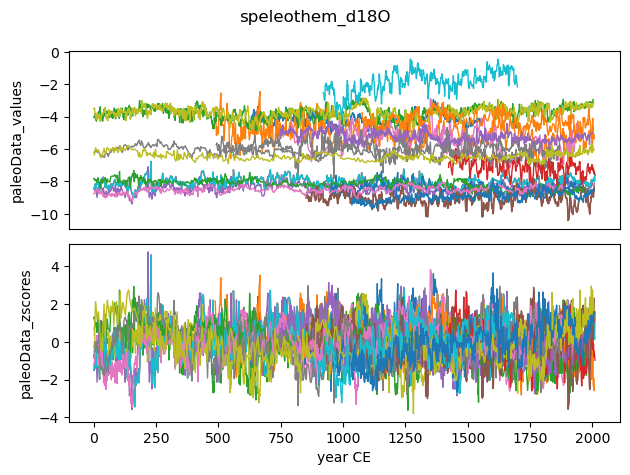

In [41]:
# add 'z-scores' to dataframe and plot z-scores and values
df_proxy = fan.add_zscores_to_df(df_proxy, key, plot_output=True)


### homogenise data dimensions across the records

Homogenised time coordinate: 650-1959 CE
Resolution: [11] years
No shared period across all records.


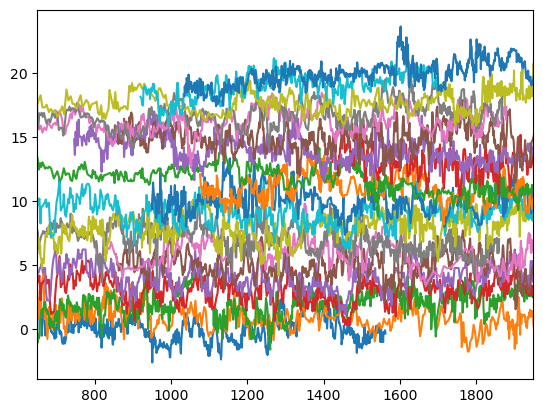

In [42]:
# define new homogenised time coordinate
df_proxy, years_hom = fan.homogenise_time(df_proxy, mny, mxy, minres, key)
time[key] = years_hom


(21, 120)
Real intersect after homogenising resolution: 
INTERSECT: 1431-1563


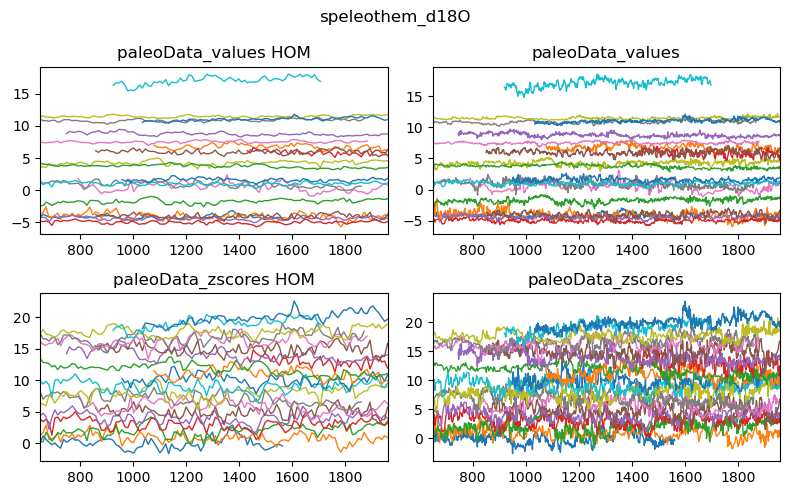

In [43]:
# assign the paleoData_values to the non-missing values in the homogenised data array

out = fan.homogenise_data_dimensions(df_proxy, years_hom, key, plot_output=True) # returns list of homogenised paleoData_values and paleoData_zscores
paleoData_values_hom, paleoData_zscores_hom, year_hom_avbl, zsco_hom_avbl = out

# define new columns in df_filt
new_columns = {'year_hom': [years_hom]*n_recs, 
               'year_hom_avbl': year_hom_avbl, 
               'paleoData_values_hom': [paleoData_values_hom[ii, :] for ii in range(n_recs)], 
               'paleoData_zscores_hom': [paleoData_zscores_hom[ii, :] for ii in range(n_recs)], 
               'paleoData_zscores_hom_avbl': zsco_hom_avbl}
df_proxy = df_proxy.assign(**new_columns)

print('Real intersect after homogenising resolution: ')
intrsct = fan.find_shared_period(df_proxy, minmax=(mny, mxy), time='year_hom_avbl', 
                             data='paleoData_zscores_hom_avbl')

data[key] = paleoData_zscores_hom


### PCA

In [44]:
covariance, overlap = fan.calc_covariance_matrix(df_proxy)

short records :  [13. 13. 26. 26.]


saved figure in /figs/dod2k_dupfree_dupfree_MT/foev_speleothem_d18O.pdf


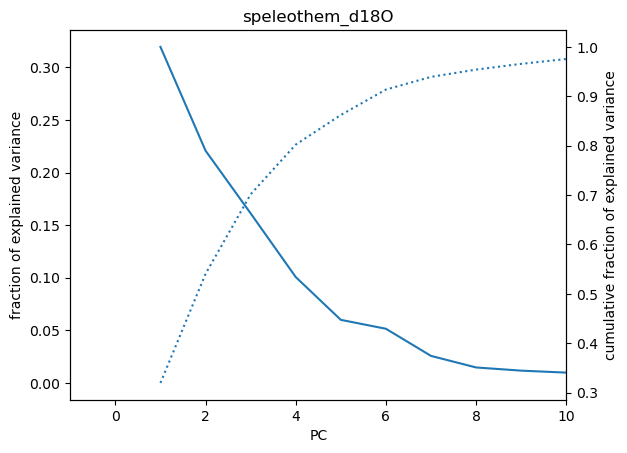

In [45]:
eigenvalues, eigenvectors = fan.PCA(covariance)

foev[key] = fan.fraction_of_explained_var(covariance, eigenvalues, n_recs, key, df.name)


saved figure in /figs/dod2k_dupfree_dupfree_MT/PCs_speleothem_d18O.pdf
saved figure in /figs/dod2k_dupfree_dupfree_MT/EOFloading_speleothem_d18O.pdf


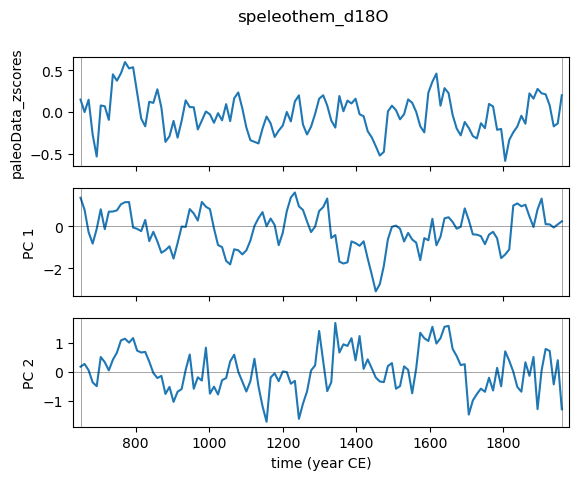

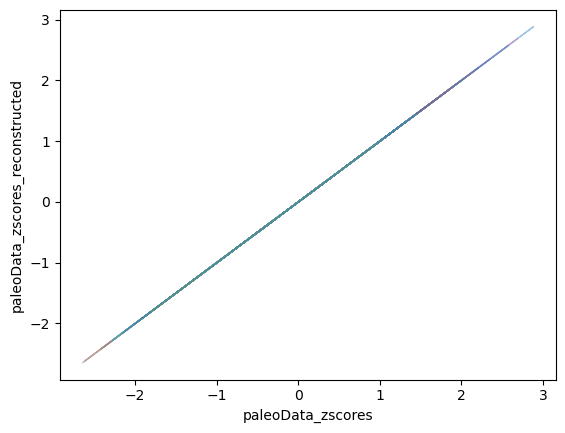

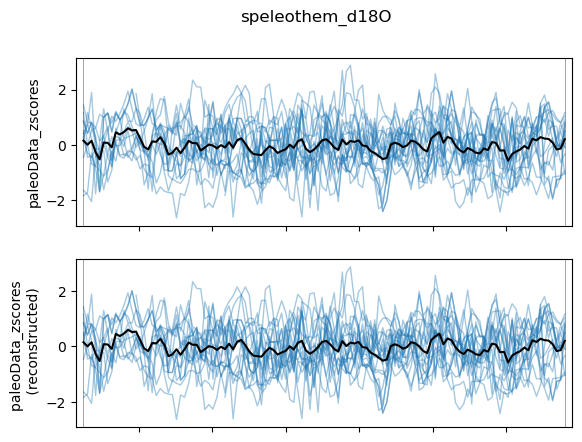

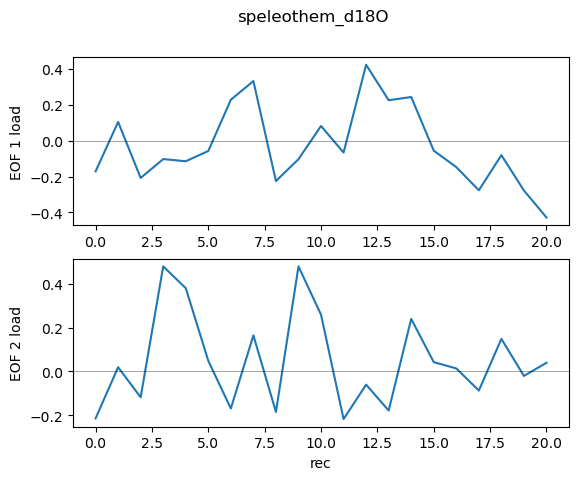

In [46]:
PCs[key], EOFs[key] = fan.plot_PCs(years_hom, eigenvectors, paleoData_zscores_hom, key, df.name)

In [47]:
print('Finished for %s'%key)

Finished for speleothem_d18O


## lake sediment d18O + d2H

### filter archive_type and paleoData_proxy

n_records   :  88
archive type:  {'lake sediment'}
proxy type:    {'d18O', 'd2H'}


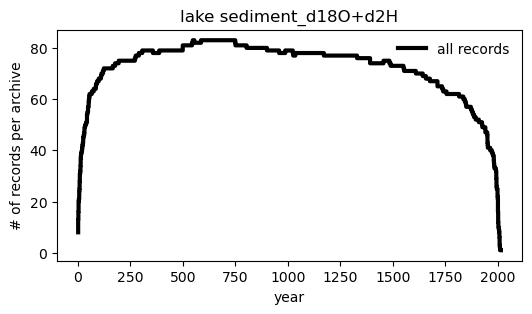

10 - 90   <95
1 - 40   <45
11 - 106  <150
28 - 324  <350
1 - 12   <15
8 - 70   <75
92 - 393  <450
7 - 33   <35
30 - 199  <250
3 - 18   <25
3 - 55   <65
6 - 52   <55
1 - 5    <5
128 - 521  <550
25 - 616  <650
3 - 75   <85


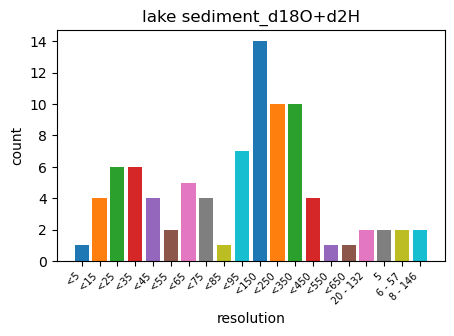

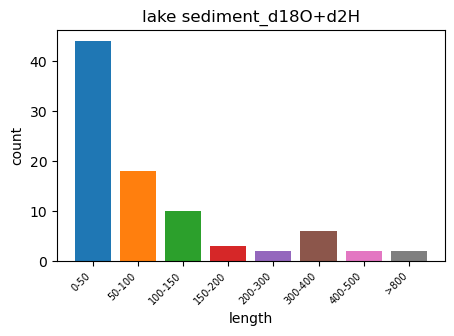

0 tree 3150
1 speleothem 562
2 coral 297
3 glacier ice 170
4 marine sediment 151
5 lake sediment 151
6 documents 15
7 sclerosponge 7
8 ground ice 4
9 borehole 3
10 mollusk shells 2
11 terrestrial sediment 2
12 hybrid 1
13 bivalve 1


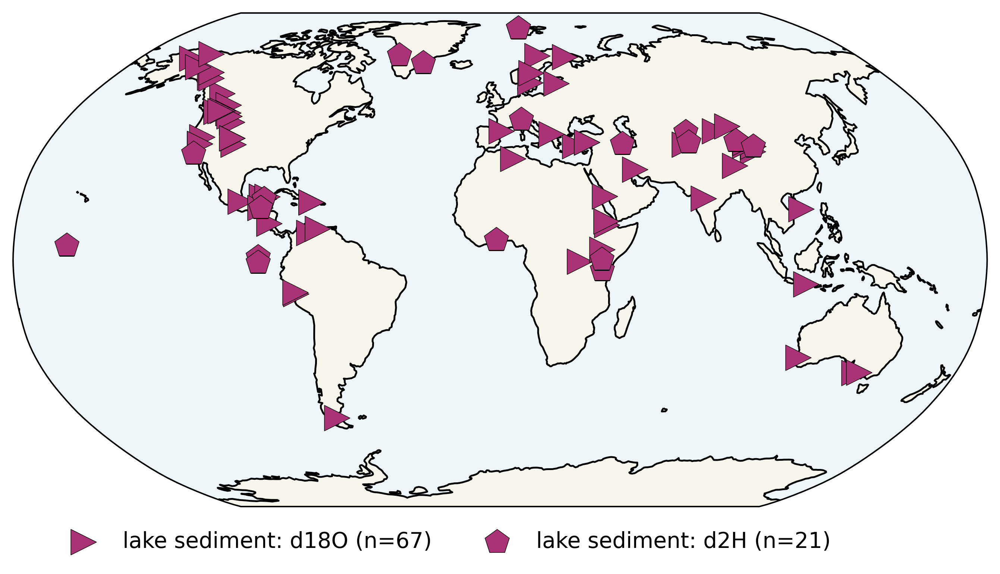

In [48]:
# (1) filter for archiveType and/or paleoData_proxy: 
at  = 'lake sediment'
pt  = 'd18O+d2H'
key = '%s_%s'%(at, pt)

keys += [key]

df_proxy = df.loc[(df['archiveType']==at)].loc[(df['paleoData_proxy']==pt.split('+')[0])|(df['paleoData_proxy']==pt.split('+')[1])]

n_recs = len(df_proxy) # number of records
print('n_records   : ', n_recs)

print('archive type: ', set(df_proxy['archiveType']))
print('proxy type:   ', set(df_proxy['paleoData_proxy']))

# (2) plot the coverage per archive 

fan.covert_subannual_to_annual(df_proxy)

df_proxy = fan.add_aux_variables(df_proxy, key, mincount=2)


# (3) plot the spatial distribution of records
geo_fig = fan.geo_plot(df_proxy)

### filter for target period, resolution and minimum record length

Keep 23 records with nyears>=100 during 300-1800. Exclude 65 records.
Keep 18 records with resolution <=55. Exclude 5 records.


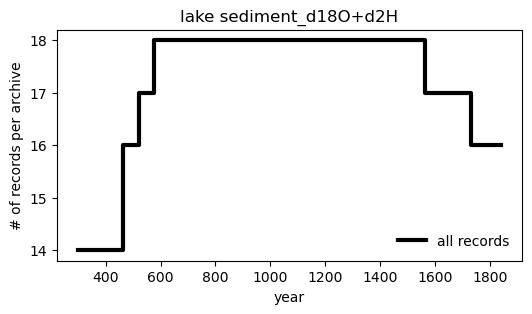

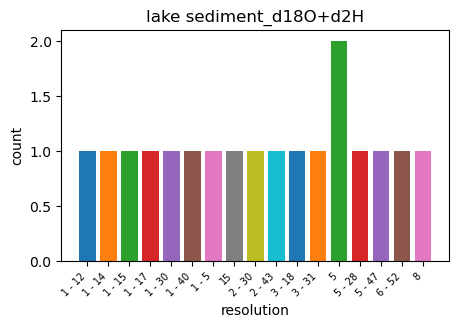

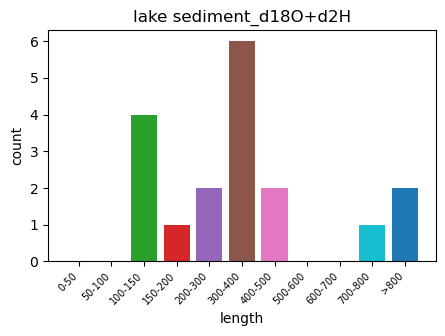

       miny    maxy originalDatabase
1163    7.0  2007.0     Iso2k v1.0.1
1166    2.0  2009.0     Iso2k v1.0.1
1170    2.0  1842.0     Iso2k v1.0.1
1174  544.0  1980.0     Iso2k v1.0.1
1177  120.0  1755.0     Iso2k v1.0.1
1181  276.0  2001.0     Iso2k v1.0.1
1184    1.0  1992.0     Iso2k v1.0.1
1190  587.0  1993.0     Iso2k v1.0.1
1196   13.0  1963.0     Iso2k v1.0.1
1205    2.0  2007.0     Iso2k v1.0.1
1207    5.0  1998.0     Iso2k v1.0.1
1209   19.0  2008.0     Iso2k v1.0.1
1213  500.0  2000.0     Iso2k v1.0.1
1214  500.0  2000.0     Iso2k v1.0.1
1218    3.0  1609.0     Iso2k v1.0.1
1221    3.0  2008.0     Iso2k v1.0.1
1240    8.0  1998.0     Iso2k v1.0.1
1241    4.0  1993.0     Iso2k v1.0.1


In [49]:
#========================= PROXY SPECIFIC=========================
minres    = 55                         # homogenised resolution
mny       = 300                      # start year of homogenised time coord
mxy       = 1800                      # end year of homogenised time coord
nyears    = np.min([100, mxy-mny])    # minimum length of each record
#====================================================================

# filter for record length during target period
df_proxy = fan.filter_record_length(df_proxy, nyears, mny, mxy, key)

# filter for resolution
df_proxy = fan.filter_resolution(df_proxy, minres, key)

# plot coverage and resolution
fan.plot_coverage(df_proxy, np.arange(mny, mxy+minres, minres), key)
fan.plot_resolution(df_proxy, key)
fan.plot_length(df_proxy, key)

n_recs = len(df_proxy) # final number of records


print(df_proxy[['miny', 'maxy', 'originalDatabase']])

pca_rec[key] = df_proxy['datasetId']

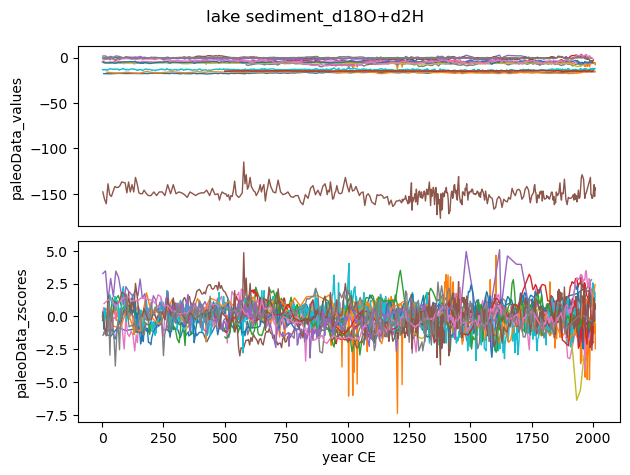

In [50]:
# add 'z-scores' to dataframe and plot z-scores and values
df_proxy = fan.add_zscores_to_df(df_proxy, key, plot_output=True)

### homogenise data dimensions across the records

Homogenised time coordinate: 300-1840 CE
Resolution: [55] years
No shared period across all records.


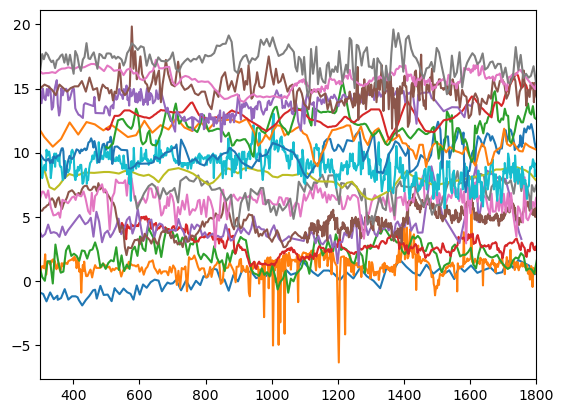

In [51]:
# define new homogenised time coordinate
df_proxy, years_hom = fan.homogenise_time(df_proxy, mny, mxy, minres, key)
time[key] = years_hom


(18, 29)
Real intersect after homogenising resolution: 
INTERSECT: 630-1620


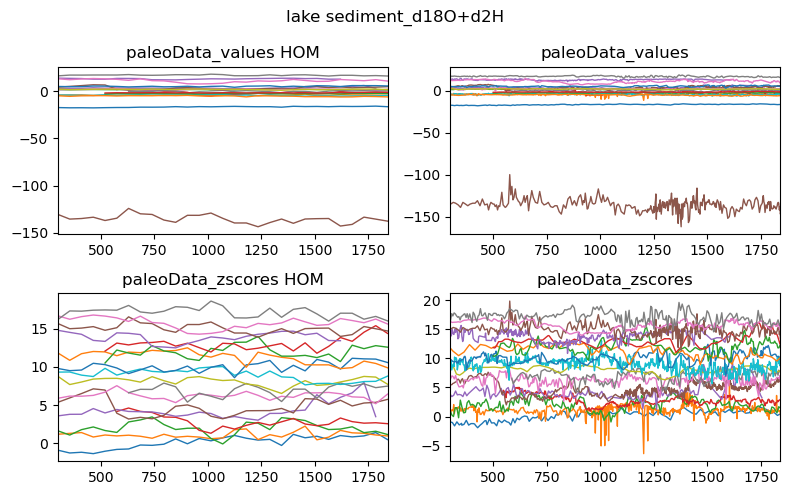

In [52]:
# assign the paleoData_values to the non-missing values in the homogenised data array

out = fan.homogenise_data_dimensions(df_proxy, years_hom, key, plot_output=True) # returns list of homogenised paleoData_values and paleoData_zscores
paleoData_values_hom, paleoData_zscores_hom, year_hom_avbl, zsco_hom_avbl = out

# define new columns in df_filt
new_columns = {'year_hom': [years_hom]*n_recs, 
               'year_hom_avbl': year_hom_avbl, 
               'paleoData_values_hom': [paleoData_values_hom[ii, :] for ii in range(n_recs)], 
               'paleoData_zscores_hom': [paleoData_zscores_hom[ii, :] for ii in range(n_recs)], 
               'paleoData_zscores_hom_avbl': zsco_hom_avbl}
df_proxy = df_proxy.assign(**new_columns)

print('Real intersect after homogenising resolution: ')
intrsct = fan.find_shared_period(df_proxy, minmax=(mny, mxy), time='year_hom_avbl', 
                             data='paleoData_zscores_hom_avbl')

data[key] = paleoData_zscores_hom


### PCA

In [53]:
covariance, overlap = fan.calc_covariance_matrix(df_proxy)

short records :  [29. 29. 29. 24. 28. 29. 29. 23. 29. 29. 29. 29. 25. 25. 25. 29. 29. 29.
 29. 29. 29. 24. 28. 29. 29. 23. 29. 29. 29. 29. 25. 25. 25. 29. 29. 29.
 29. 29. 29. 24. 28. 29. 29. 23. 29. 29. 29. 29. 25. 25. 25. 29. 29. 29.
 24. 24. 24. 24. 23. 24. 24. 23. 24. 24. 24. 24. 24. 24. 20. 24. 24. 24.
 28. 28. 28. 23. 28. 28. 28. 22. 28. 28. 28. 28. 24. 24. 25. 28. 28. 28.
 29. 29. 29. 24. 28. 29. 29. 23. 29. 29. 29. 29. 25. 25. 25. 29. 29. 29.
 29. 29. 29. 24. 28. 29. 29. 23. 29. 29. 29. 29. 25. 25. 25. 29. 29. 29.
 23. 23. 23. 23. 22. 23. 23. 23. 23. 23. 23. 23. 23. 23. 19. 23. 23. 23.
 29. 29. 29. 24. 28. 29. 29. 23. 29. 29. 29. 29. 25. 25. 25. 29. 29. 29.
 29. 29. 29. 24. 28. 29. 29. 23. 29. 29. 29. 29. 25. 25. 25. 29. 29. 29.
 29. 29. 29. 24. 28. 29. 29. 23. 29. 29. 29. 29. 25. 25. 25. 29. 29. 29.
 29. 29. 29. 24. 28. 29. 29. 23. 29. 29. 29. 29. 25. 25. 25. 29. 29. 29.
 25. 25. 25. 24. 24. 25. 25. 23. 25. 25. 25. 25. 25. 25. 21. 25. 25. 25.
 25. 25. 25. 24. 24. 25. 25. 23. 2

saved figure in /figs/dod2k_dupfree_dupfree_MT/foev_lake sediment_d18O+d2H.pdf


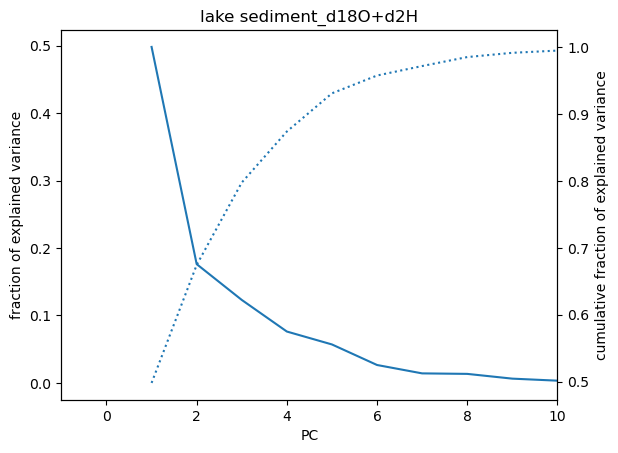

In [54]:
eigenvalues, eigenvectors = fan.PCA(covariance)

foev[key] = fan.fraction_of_explained_var(covariance, eigenvalues, n_recs, key, df.name)


saved figure in /figs/dod2k_dupfree_dupfree_MT/PCs_lake sediment_d18O+d2H.pdf
saved figure in /figs/dod2k_dupfree_dupfree_MT/EOFloading_lake sediment_d18O+d2H.pdf


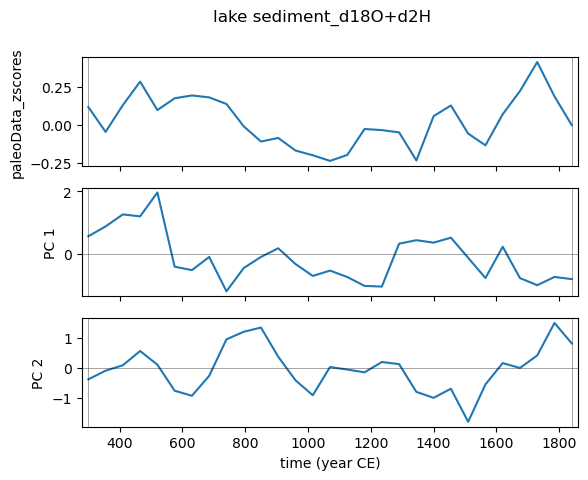

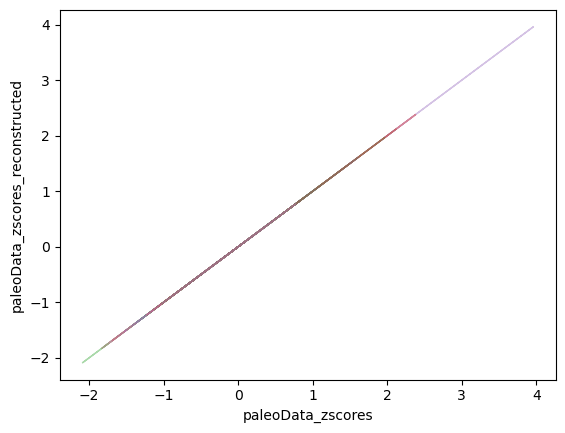

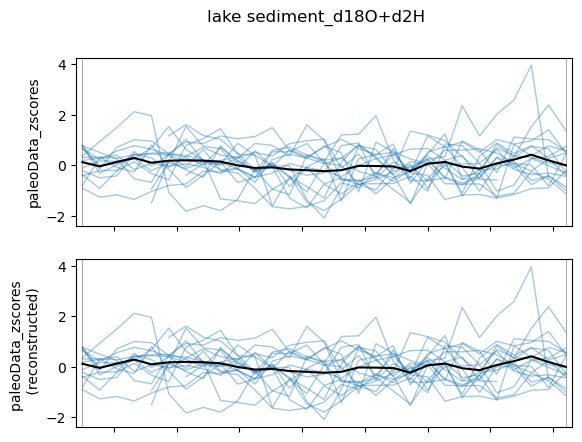

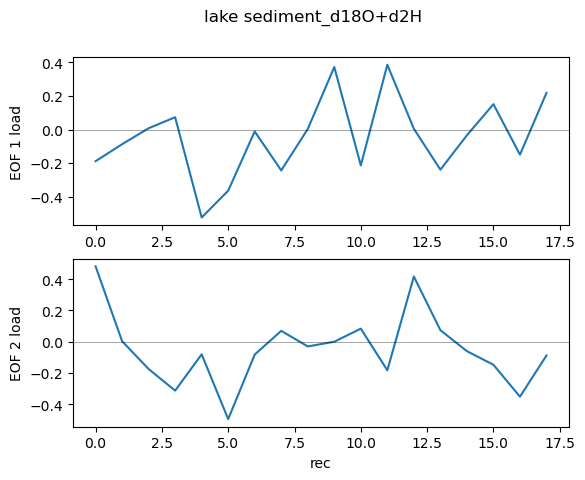

In [55]:
PCs[key], EOFs[key] = fan.plot_PCs(years_hom, eigenvectors, paleoData_zscores_hom, key, df.name)

In [56]:
print('Finished for %s'%key)

Finished for lake sediment_d18O+d2H


## marine sediment d18O

### filter archive_type and paleoData_proxy

n_records   :  54
archive type:  {'marine sediment'}
proxy type:    {'d18O'}


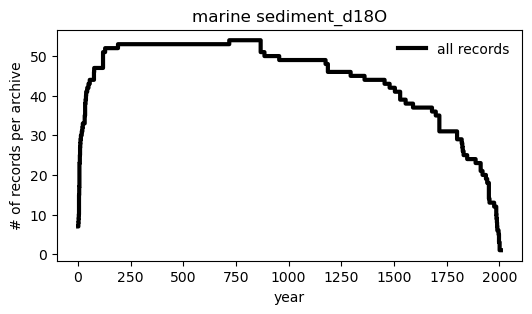

34 - 40   <45
8 - 64   <65
7 - 122  <150
60 - 1187  <1250
11 - 50   <55
34 - 78   <85
22 - 26   <35
3 - 4    <5
34 - 69   <75
39 - 164  <250
2 - 22   <25
53 - 408  <450
38 - 90   <95
244 - 293  <350


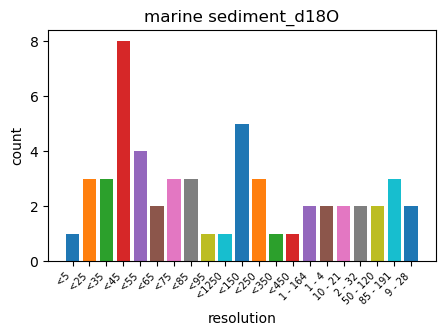

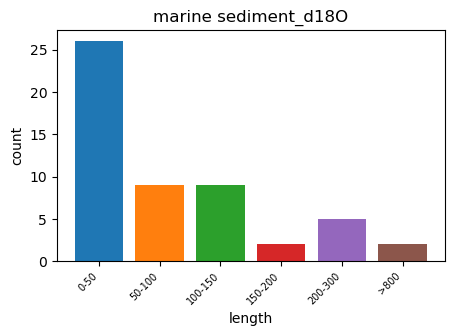

0 tree 3150
1 speleothem 562
2 coral 297
3 glacier ice 170
4 marine sediment 151
5 lake sediment 151
6 documents 15
7 sclerosponge 7
8 ground ice 4
9 borehole 3
10 mollusk shells 2
11 terrestrial sediment 2
12 hybrid 1
13 bivalve 1


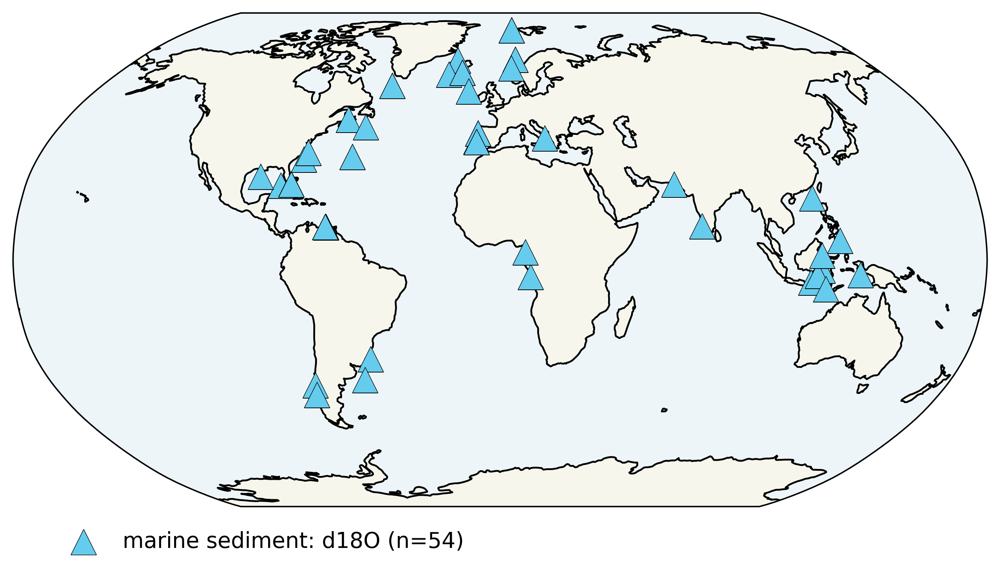

In [57]:
# (1) filter for archiveType and/or paleoData_proxy: 
at  = 'marine sediment'
pt  = 'd18O'
key = '%s_%s'%(at, pt)

keys += [key]

df_proxy = df.loc[(df['archiveType']==at)].loc[(df['paleoData_proxy']==pt)] # filter records for specific archive and proxy type

n_recs = len(df_proxy) # number of records
print('n_records   : ', n_recs)

print('archive type: ', set(df_proxy['archiveType']))
print('proxy type:   ', set(df_proxy['paleoData_proxy']))

# (2) plot the coverage per archive 

fan.covert_subannual_to_annual(df_proxy)

df_proxy = fan.add_aux_variables(df_proxy, key, mincount=2)


# (3) plot the spatial distribution of records
geo_fig = fan.geo_plot(df_proxy)

### filter for target period, resolution and minimum record length

Keep 14 records with nyears>=100 during 100-1800. Exclude 40 records.
Keep 14 records with resolution <=100. Exclude 0 records.


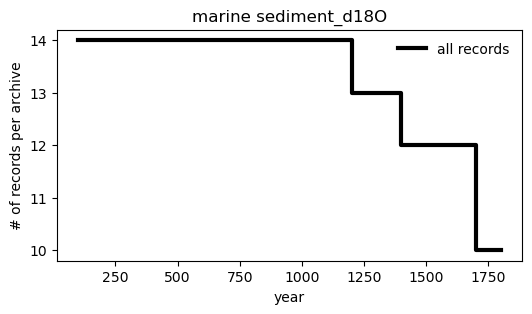

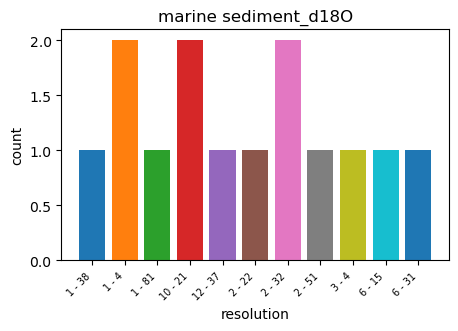

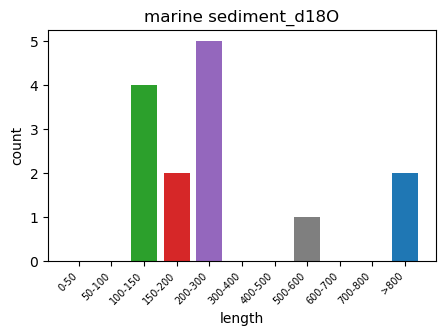

      miny    maxy originalDatabase
1246   8.0  1985.0     Iso2k v1.0.1
1247   8.0  1985.0     Iso2k v1.0.1
1248   8.0  1799.0     Iso2k v1.0.1
1249   8.0  1799.0     Iso2k v1.0.1
1252   1.0  1950.0     Iso2k v1.0.1
1253   1.0  1950.0     Iso2k v1.0.1
1261  12.0  1455.0     Iso2k v1.0.1
1269   5.0  1996.0     Iso2k v1.0.1
1270   3.0  1986.0     Iso2k v1.0.1
1273   1.0  1975.0     Iso2k v1.0.1
1277  45.0  1989.0     Iso2k v1.0.1
1284   6.0  1998.0     Iso2k v1.0.1
1285  13.0  1294.0     Iso2k v1.0.1
1292   1.0  2001.0     Iso2k v1.0.1


In [58]:
#========================= PROXY SPECIFIC=========================
minres    = 100                         # homogenised resolution
mny       = 100                      # start year of homogenised time coord
mxy       = 1800                      # end year of homogenised time coord
nyears    = np.min([100, mxy-mny])    # minimum length of each record
#====================================================================

# filter for record length during target period
df_proxy = fan.filter_record_length(df_proxy, nyears, mny, mxy, key)

# filter for resolution
df_proxy = fan.filter_resolution(df_proxy, minres, key)

# plot coverage and resolution
fan.plot_coverage(df_proxy, np.arange(mny, mxy+minres, minres), key)
fan.plot_resolution(df_proxy, key)
fan.plot_length(df_proxy, key)

n_recs = len(df_proxy) # final number of records


print(df_proxy[['miny', 'maxy', 'originalDatabase']])

pca_rec[key] = df_proxy['datasetId']

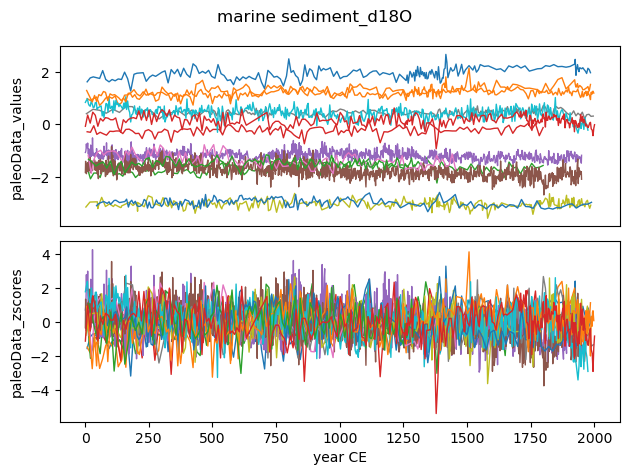

In [59]:
# add 'z-scores' to dataframe and plot z-scores and values
df_proxy = fan.add_zscores_to_df(df_proxy, key, plot_output=True)

### homogenise data dimensions across the records

Homogenised time coordinate: 100-1800 CE
Resolution: [100] years
No shared period across all records.


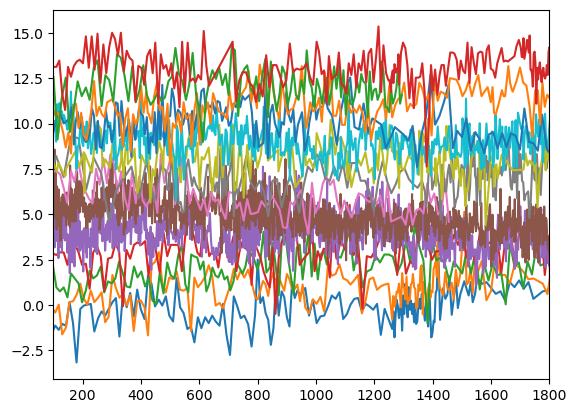

In [60]:
# define new homogenised time coordinate
df_proxy, years_hom = fan.homogenise_time(df_proxy, mny, mxy, minres, key)
time[key] = years_hom


(14, 18)
Real intersect after homogenising resolution: 
INTERSECT: 100-1300


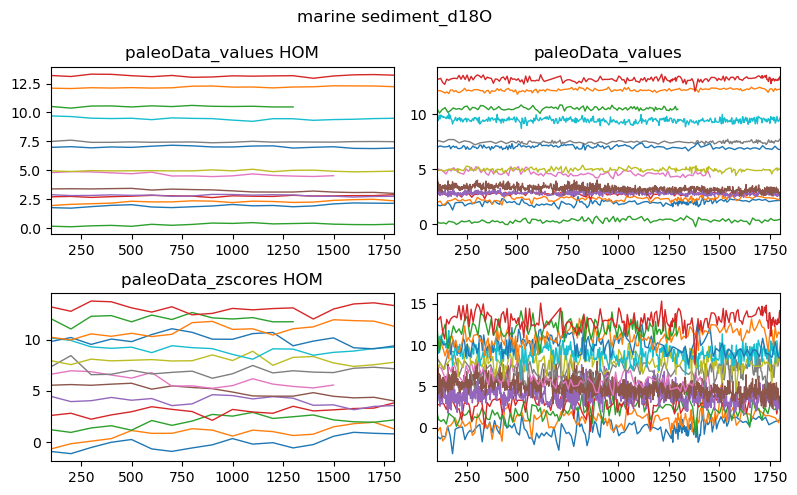

In [61]:
# assign the paleoData_values to the non-missing values in the homogenised data array

out = fan.homogenise_data_dimensions(df_proxy, years_hom, key, plot_output=True) # returns list of homogenised paleoData_values and paleoData_zscores
paleoData_values_hom, paleoData_zscores_hom, year_hom_avbl, zsco_hom_avbl = out

# define new columns in df_filt
new_columns = {'year_hom': [years_hom]*n_recs, 
               'year_hom_avbl': year_hom_avbl, 
               'paleoData_values_hom': [paleoData_values_hom[ii, :] for ii in range(n_recs)], 
               'paleoData_zscores_hom': [paleoData_zscores_hom[ii, :] for ii in range(n_recs)], 
               'paleoData_zscores_hom_avbl': zsco_hom_avbl}
df_proxy = df_proxy.assign(**new_columns)

print('Real intersect after homogenising resolution: ')
intrsct = fan.find_shared_period(df_proxy, minmax=(mny, mxy), time='year_hom_avbl', 
                             data='paleoData_zscores_hom_avbl')

data[key] = paleoData_zscores_hom


### PCA

In [62]:
covariance, overlap = fan.calc_covariance_matrix(df_proxy)

short records :  [18. 18. 18. 18. 18. 18. 15. 18. 18. 18. 18. 18. 13. 18. 18. 18. 18. 18.
 18. 18. 15. 18. 18. 18. 18. 18. 13. 18. 18. 18. 18. 18. 18. 18. 15. 18.
 18. 18. 18. 18. 13. 18. 18. 18. 18. 18. 18. 18. 15. 18. 18. 18. 18. 18.
 13. 18. 18. 18. 18. 18. 18. 18. 15. 18. 18. 18. 18. 18. 13. 18. 18. 18.
 18. 18. 18. 18. 15. 18. 18. 18. 18. 18. 13. 18. 15. 15. 15. 15. 15. 15.
 15. 15. 15. 15. 15. 15. 13. 15. 18. 18. 18. 18. 18. 18. 15. 18. 18. 18.
 18. 18. 13. 18. 18. 18. 18. 18. 18. 18. 15. 18. 18. 18. 18. 18. 13. 18.
 18. 18. 18. 18. 18. 18. 15. 18. 18. 18. 18. 18. 13. 18. 18. 18. 18. 18.
 18. 18. 15. 18. 18. 18. 18. 18. 13. 18. 18. 18. 18. 18. 18. 18. 15. 18.
 18. 18. 18. 18. 13. 18. 13. 13. 13. 13. 13. 13. 13. 13. 13. 13. 13. 13.
 13. 13. 18. 18. 18. 18. 18. 18. 15. 18. 18. 18. 18. 18. 13. 18.]


saved figure in /figs/dod2k_dupfree_dupfree_MT/foev_marine sediment_d18O.pdf


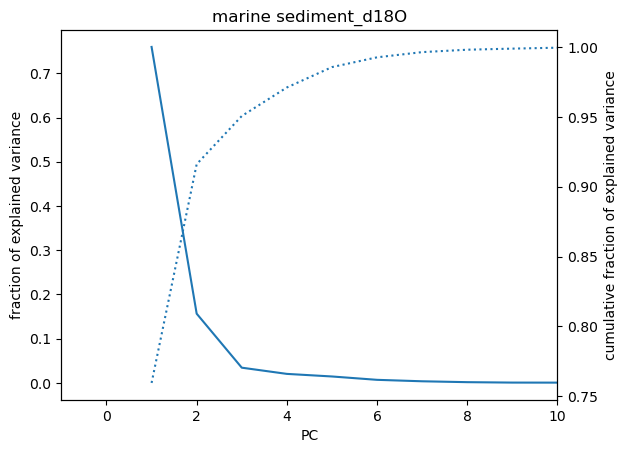

In [63]:
eigenvalues, eigenvectors = fan.PCA(covariance)

foev[key] = fan.fraction_of_explained_var(covariance, eigenvalues, n_recs, key, df.name)


saved figure in /figs/dod2k_dupfree_dupfree_MT/PCs_marine sediment_d18O.pdf
saved figure in /figs/dod2k_dupfree_dupfree_MT/EOFloading_marine sediment_d18O.pdf


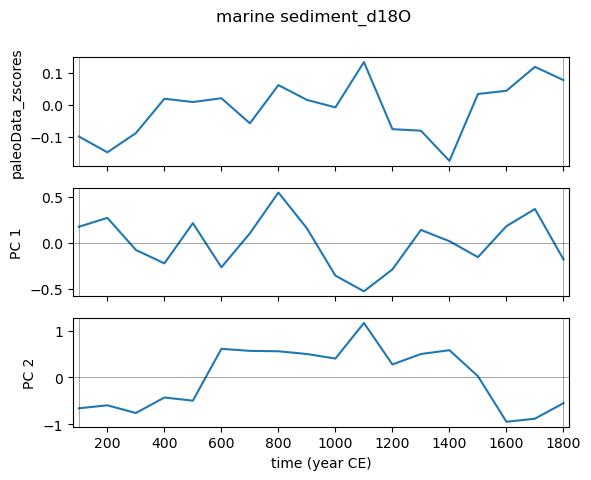

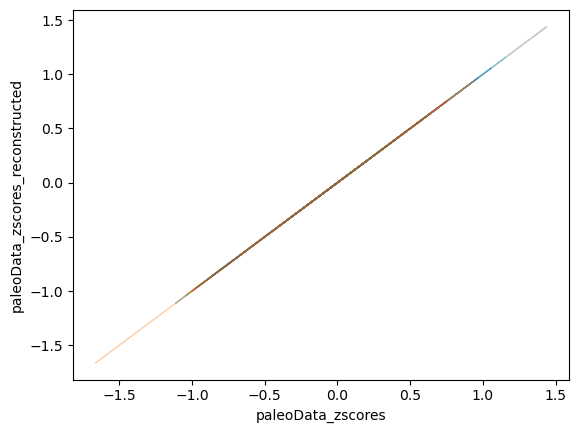

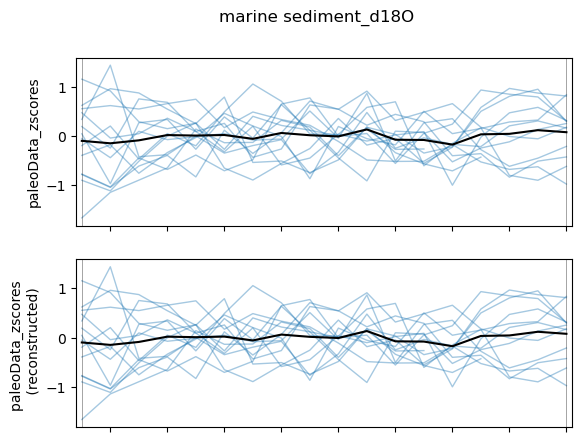

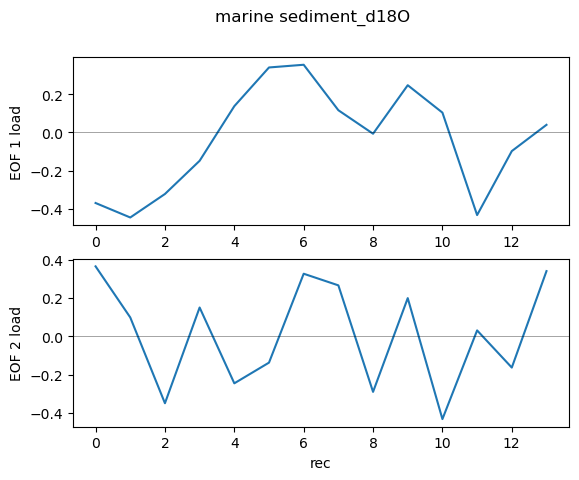

In [64]:
PCs[key], EOFs[key] = fan.plot_PCs(years_hom, eigenvectors, paleoData_zscores_hom, key, df.name)

In [65]:
print('Finished for %s'%key)

Finished for marine sediment_d18O


# summary figures

In [66]:
key_colour = {}
for key in keys:
    key_colour[key]=archive_colour[key.split('_')[0]]

key_colour['tree_d18O']='k'

## mean z-score

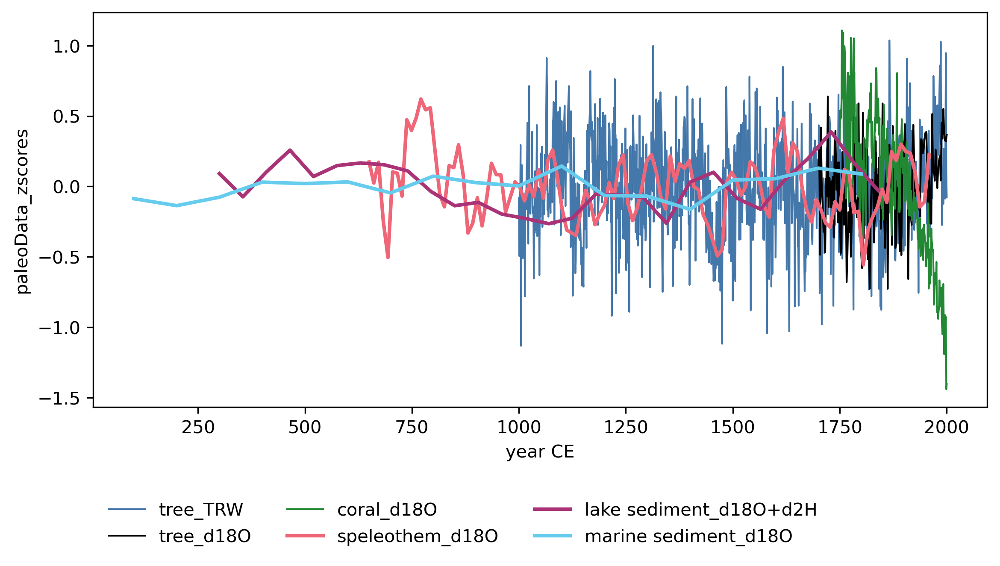

In [67]:
# as a comparison plot the mean over all records
fig = plt.figure(figsize=(9, 4), dpi=300)
for key in keys:
    lw = 1 if key in ['tree_TRW', 'tree_d18O', 'coral_d18O'] else 2
    plt.plot(time[key], np.ma.mean(data[key], axis=0)-np.mean(np.ma.mean(data[key], axis=0)), 
             label=key, lw=lw, color=key_colour[key])
plt.ylabel('paleoData_zscores')
plt.xlabel('year CE')
plt.legend(ncol=3, bbox_to_anchor=(0,-0.2), loc='upper left', framealpha=0)
plt.show()

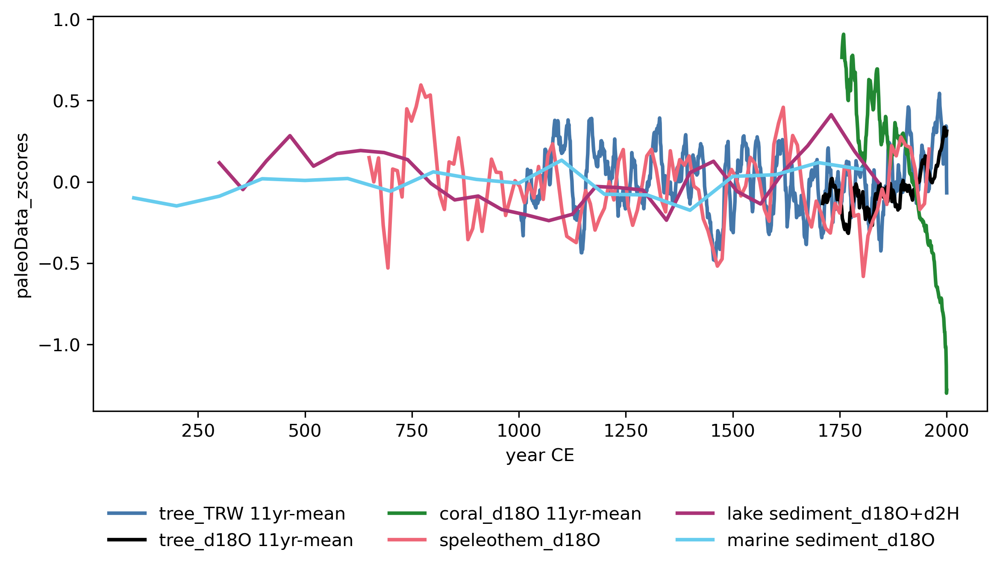

In [68]:
# as a comparison plot the mean over all records SMOOTHED
fig = plt.figure(figsize=(9, 4), dpi=300)
for key in keys:
    if key in ['tree_TRW', 'tree_d18O', 'coral_d18O']:
        tt, dd = fan.smooth(np.ma.mean(data[key], axis=0), time[key], 11)
        label=key+' 11yr-mean'
    else:
        tt, dd = time[key], np.ma.mean(data[key], axis=0)
        label=key
    plt.plot(tt, dd, label=label, lw=2, color=key_colour[key])
plt.ylabel('paleoData_zscores')
plt.xlabel('year CE')    
plt.legend(ncol=3, bbox_to_anchor=(0,-0.2), loc='upper left', framealpha=0)
plt.show()

## Fraction of Explained Variance

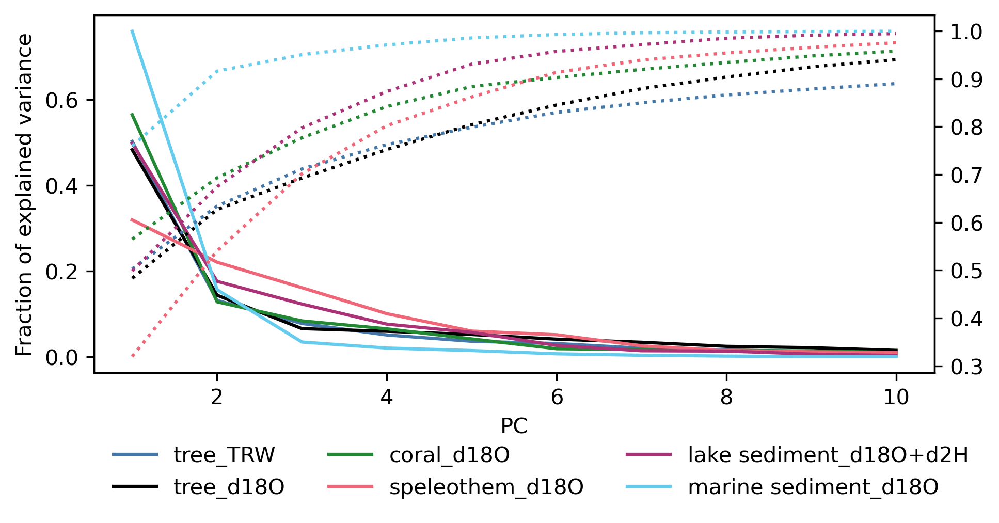

In [69]:
fig = plt.figure(figsize=(7,3), dpi=300)
ax  = plt.gca()
ax2 = ax.twinx()
for key in keys:
    ax.plot(range(1,11), foev[key][:10], label=key, color=key_colour[key])
    ax2.plot(range(1,11), np.cumsum(foev[key][:10]), label=key, ls=':', color=key_colour[key])
ax.set_ylabel('Fraction of explained variance')
# ax2.set_ylabel('Cumulative fraction of explained variance')
ax.set_xlabel('PC')    
ax.legend(ncol=3, bbox_to_anchor=(0,-0.15), loc='upper left', framealpha=0)

## 1st and 2nd PC

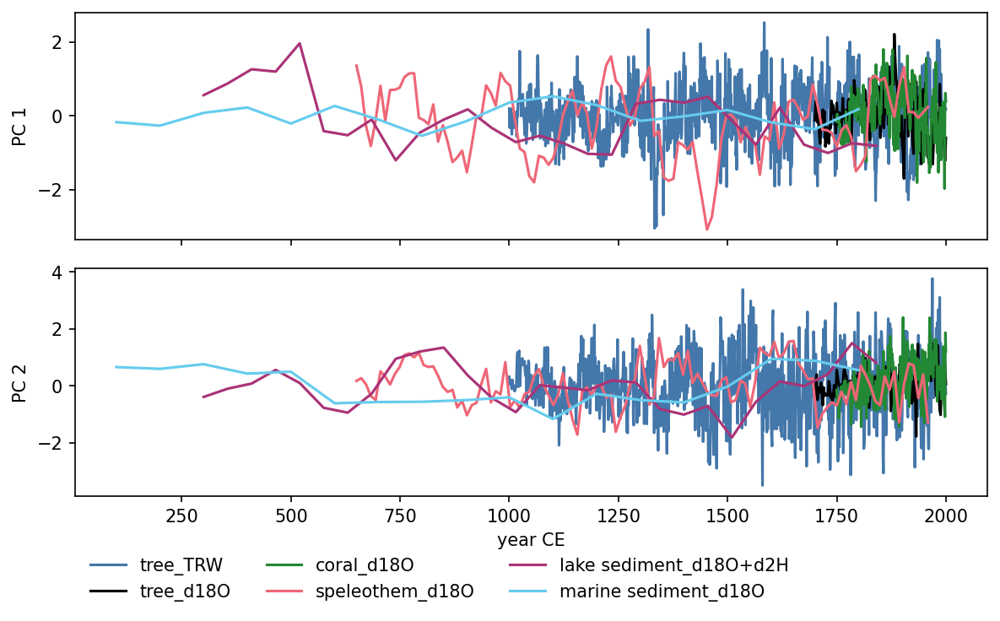

In [70]:
# plot PCs of different proxy types on the same axis. 
# Note that these are plotted as calculated in the respective analysis- NOT standardised differently!

fig = plt.figure(figsize=(8,5), dpi=150)

grid = GS(2,1)
for ii in range(2):
    ax = plt.subplot(grid[ii,:])
    for key in keys:
        a=1 if key in ['tree_TRW', 'speleothem_d18O', 'lake sediment_d18O+d2H'] else -1
        plt.plot(time[key], a*PCs[key][ii], label=key, color=key_colour[key])
    if ii==0: 
        ax.axes.xaxis.set_ticklabels([])
    plt.ylabel('PC %d'%(ii+1)) 
plt.xlabel('year CE')

plt.legend(ncol=3, bbox_to_anchor=(0,-0.2), 
           loc='upper left', framealpha=0)
grid.tight_layout(fig)



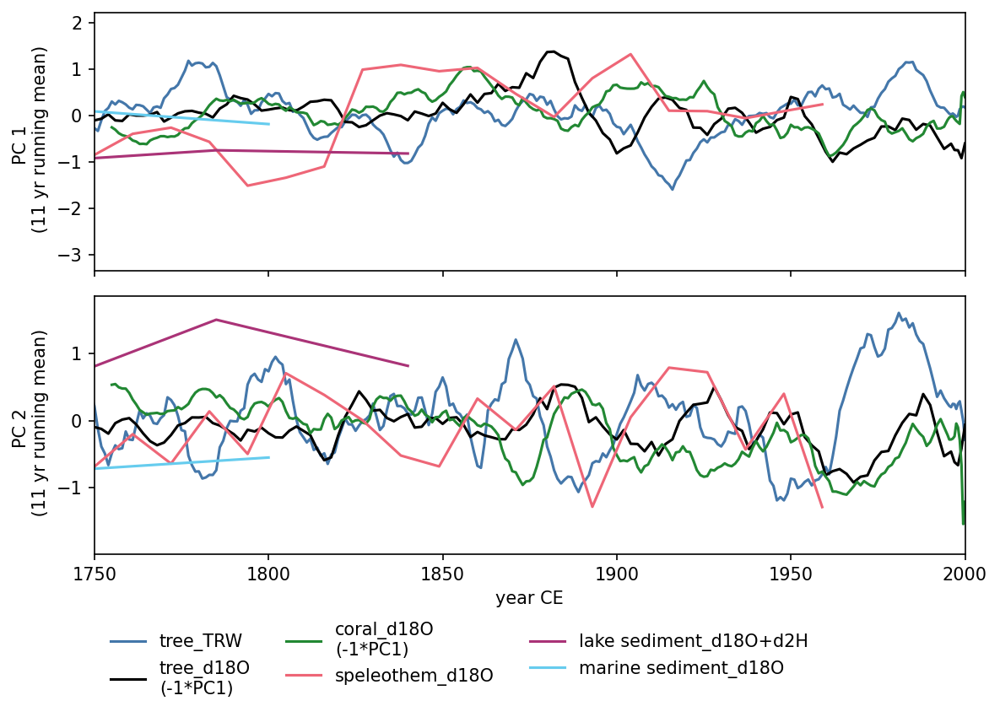

In [71]:
# plot PCs of different proxy types on the same axis. 
# SMOOTHED VIA 11YEAR RUNNING MEAN
fig = plt.figure(figsize=(8,5), dpi=150)

grid = GS(2,1)
for ii in range(2):
    ax = plt.subplot(grid[ii,:])
    for key in keys:
        label = key
        if ((key in ['tree_d18O', 'coral_d18O']) and (ii==0)):
            a = -1 
            label+= '\n(-1*PC1)'
        else:
            a = 1
        resolution = np.unique(np.diff(time[key]))[0]
        if key in ['tree_TRW', 'tree_d18O', 'coral_d18O']:
            smooth = 11
            tt, dd = fan.smooth(PCs[key][ii], time[key], int(smooth/resolution))
            # label+=' %d-yr mean'%smooth
        else:
            tt, dd = time[key], PCs[key][ii]
        plt.plot(tt, a*np.array(dd), label=label, color=key_colour[key])
        
    plt.ylabel('PC %d \n (%d yr running mean)'%(ii+1, smooth))
    plt.xlim(1750,2000)
    if ii==0: 
        ax.axes.xaxis.set_ticklabels([])
        hh, ll = ax.get_legend_handles_labels()
plt.xlabel('year CE')

grid.tight_layout(fig)

plt.legend(hh, ll, ncol=3, bbox_to_anchor=(0,-0.2), 
           loc='upper left', framealpha=0)
plt.show()


## 1st and 2nd EOF

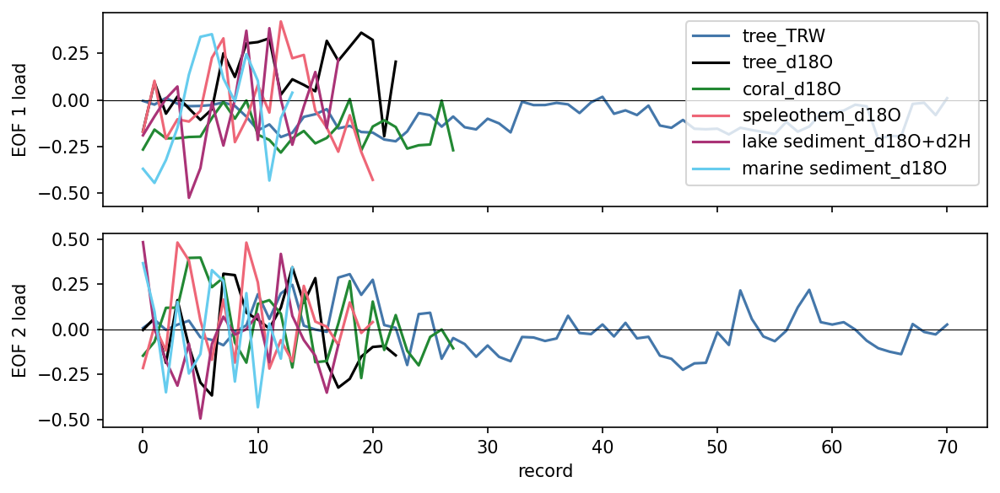

In [72]:

fig = plt.figure(figsize=(8,4), dpi=150)

grid = GS(2,1)
for key in keys:
    n_recs = data[key].shape[0]
    for ii in range(2):
        ax = plt.subplot(grid[ii,:])
        plt.plot(range(n_recs), EOFs[key][ii], label=key, color=key_colour[key])
        if ii==1: plt.xlabel('record')
        plt.ylabel('EOF %d load'%(ii+1))
        plt.axhline(0, color='k', alpha=0.5, lw=0.5)
        if ii==0: 
            ax.axes.xaxis.set_ticklabels([])
        if ii==0: plt.legend()
grid.tight_layout(fig)

## spatial EOF load

saved figure in /dod2k_dupfree_dupfree_MT/figs///MT_spatial_EOF1.pdf


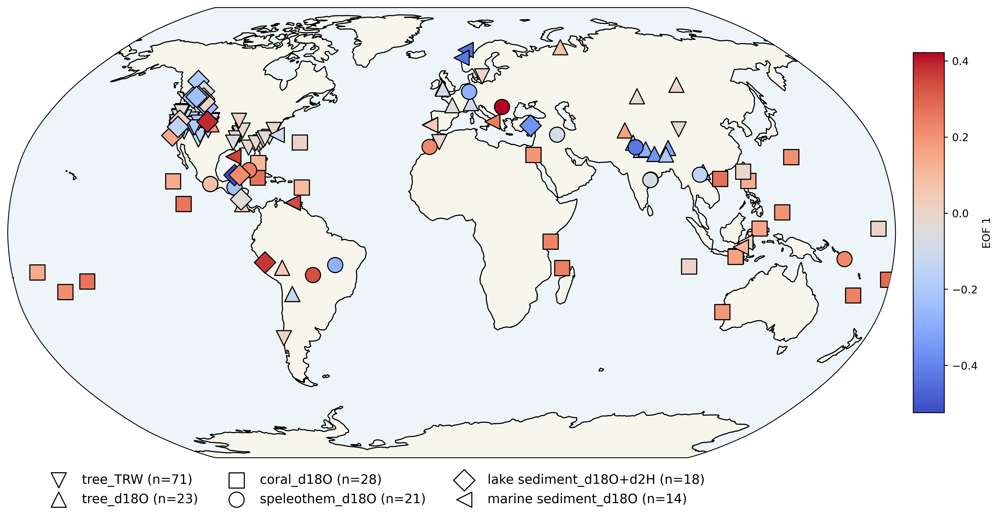

In [73]:
fig = fan.geo_EOF_plot(df, pca_rec, EOFs, keys)
#print(keys)
f.figsave(fig, 'MT_spatial_EOF1', addfigs='/%s/figs/'%df.name)

## spatial distribution

0 tree 3150
1 speleothem 562
2 coral 297
3 glacier ice 170
4 marine sediment 151
5 lake sediment 151
6 documents 15
7 sclerosponge 7
8 ground ice 4
9 borehole 3
10 mollusk shells 2
11 terrestrial sediment 2
12 hybrid 1
13 bivalve 1
saved figure in /dod2k_dupfree_dupfree_MT/figs///MT_spatial.pdf


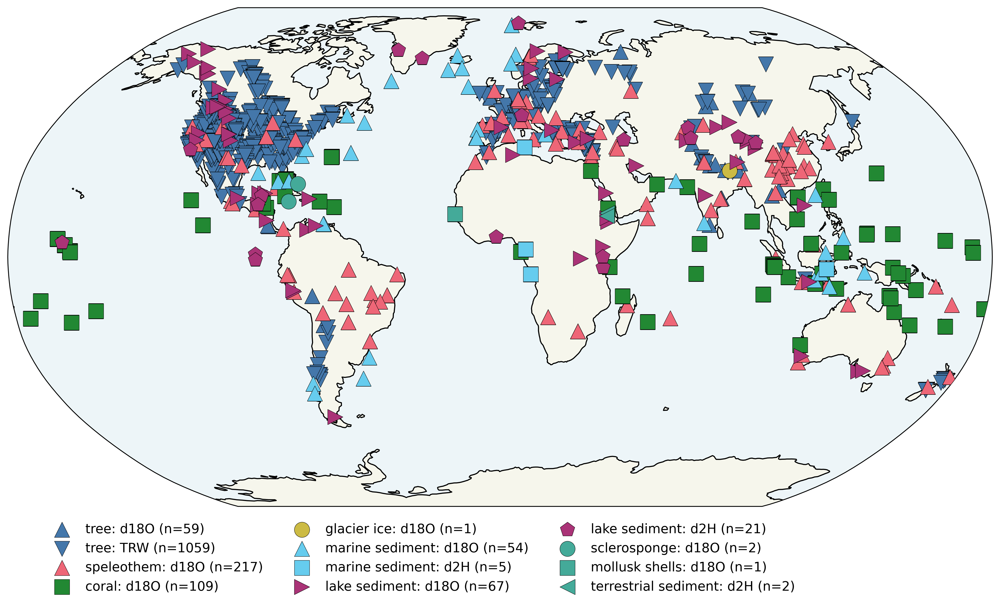

In [74]:
fig = fan.geo_plot(df, fs=(13,8))

# There is a bug in this figure due to lake sediments not being bolded!!

f.figsave(fig, 'MT_spatial', addfigs='/%s/figs/'%df.name)

saved figure in /dod2k_dupfree_dupfree_MT/figs///MT_PCA.pdf


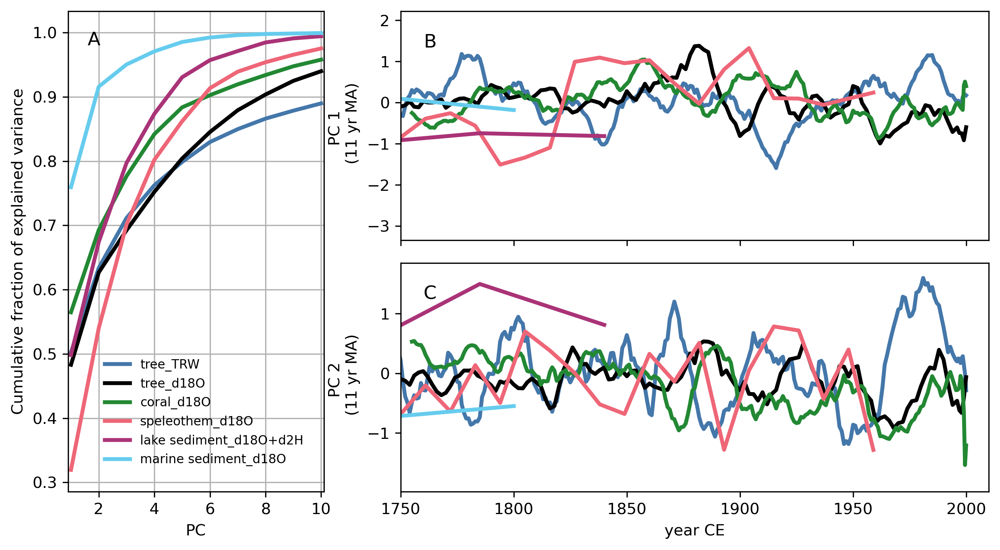

In [76]:
# as a comparison plot the mean over all records SMOOTHED
fig = plt.figure(figsize=(9, 5), dpi=300)

grid = GS(2,3)

ax=plt.subplot(grid[:,0])
ax  = plt.gca()
# ax2 = ax.twinx()
for key in keys:
    # ax.plot(range(1,9), foev[key][:8], label=key, color=key_colour[key])
    ax.plot(range(1,11), np.cumsum(foev[key][:10]), label=key, color=key_colour[key], lw=2.5)
ax.set_ylabel('Cumulative fraction of explained variance')
ax.set_xlabel('PC')    
ax.set_xlim(.9,10.1)
plt.title('A', x=0.1, y=0.91)

grid.tight_layout(fig)
grid.update(hspace=0.1,wspace=0.3)
plt.legend(ncol=1, bbox_to_anchor=(0.1,0.3), 
           loc='upper left', framealpha=0, fontsize=8)
plt.grid()

smooth = 11
            
for key in keys:
    label = key
    resolution = np.unique(np.diff(time[key]))[0]
    #print(resolution, smooth, int(smooth/resolution))

    if resolution<smooth:
        tt, dd = fan.smooth(np.ma.mean(data[key], axis=0), time[key], smooth)
    else:
        tt, dd = time[key], np.ma.mean(data[key], axis=0)
    
    for ii in range(2):
        ax = plt.subplot(grid[ii,1:4])
        # warmer and wetter is more negative in coral d18O; 
        # warmer is more positive and wetter is more negative (maybe?) in tree d18O
        if ((key in ['tree_d18O', 'coral_d18O']) and (ii==0)):
            a = -1 # multiply PC sign by -1
            label+= '\n(-1*PC1)' # and label it as such
        else:
            a = 1
        if resolution<smooth:
            tt, dd = fan.smooth(PCs[key][ii], time[key], int(smooth/resolution))
        else:
            tt, dd = time[key], PCs[key][ii]
        plt.plot(tt, a*np.array(dd), label=label, color=key_colour[key], lw=2.5)
        plt.ylabel('PC %d \n (%d yr MA)'%(ii+1, smooth))
        plt.grid()
        if ii==0: 
            ax.axes.xaxis.set_ticklabels([])
        plt.title('BC'[ii], x=0.05, y=0.8)
        plt.xlim(1750, 2010)
        
plt.xlabel('year CE')


f.figsave(fig, 'MT_PCA', addfigs='/%s/figs/'%df.name)